In [1]:
from scipy.io import netcdf
import numpy as np
from pylab import clf, plot, show, floor, ceil, imshow
import matplotlib
import matplotlib.pyplot as plt 
%matplotlib inline
#xlabel, ylabel, legend, savefig, colorbar, title, clim, pcolor, cm, contourf
import os
import csv
import sys
import glob
from netCDF4 import Dataset

from IPython.display import display, Math, Latex, Image
from mpl_toolkits.basemap import Basemap
import mpl_toolkits

sys.path.append('/noc/users/am8e13/PyNGL-1.4.0/lib/python2.7/site-packages/PyNGL/')
import Ngl
sys.path.append('/noc/users/am8e13/Python/')
import komod
sys.path.append('/noc/users/am8e13/Python/PyNIO-1.4.0/')
import Nio

from python_functions import *
import cmocean
import random
import calendar

from IPython.html.widgets import interact, interactive
from IPython.display import clear_output, display, HTML

Vendor:  Continuum Analytics, Inc.
Package: mkl
Message: trial mode expires in 30 days
:0: FutureWarning: IPython widgets are experimental and may change in the future.


In [2]:
pert_const = RunRead()
pert_const.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_cont_ptrac/results/')
pert_const.readStateData(range(0,360,12))
pert_const.title('Const restoring','red')
pert_const.readMonitorData([6220800,6480000])
pert_const.readMonitorSeaiceData([6220800,6480000])
pert_const.readDynStData([6220800,6480000])
pert_const.readTracers(range(0,360,12))
pert_const.readLayers(range(0,360,12))
pert_const.read_flux('exp_contsalt')
pert_const.read_psi('exp_contsalt')
pert_const.readDynStDiagLayers([6220800,6480000])
pert_const.readDynStDiagPtracers([6220800,6480000])

/noc/users/am8e13/anaconda/lib/python2.7/site-packages/scipy/io/netcdf.py:287: RuntimeWarning: Cannot close a netcdf_file opened with mmap=True, when netcdf_variables or arrays referring to its data still exist. All data arrays obtained from such files refer directly to data on disk, and must be copied before the file can be cleanly closed. (See netcdf_file docstring for more information on mmap.)
  ), category=RuntimeWarning)
/noc/users/am8e13/anaconda/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:598: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


Data read from /hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_cont_ptrac/results/
Read Monitor
Read Seaice Monitor
Read StDyn data
Read tracers
Read ['LaUH1TH', 'LaVH1TH', 'LaUH2RHO', 'LaVH2RHO', 'LaTr2RHO']


/noc/users/am8e13/anaconda/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


In [3]:
pert_bench = RunRead()
pert_bench.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_benchmark/results/')
pert_bench.title('No restoring','blue')
pert_bench.readStateData(range(0,360,12))
pert_bench.readMonitorData([6220800,6480000,6739200])
pert_bench.readMonitorSeaiceData([6220800,6480000,6739200])
pert_bench.readDynStData([6220800,6480000,6739200])
pert_bench.readTracers(range(0,360,12))
pert_bench.readLayers(range(0,360,12))
pert_bench.read_flux('exp_benchmark')
pert_bench.read_psi('exp_benchmark')
pert_bench.readDynStDiagLayers([6220800,6480000,6739200])
pert_bench.readDynStDiagPtracers([6220800,6480000,6739200])

Data read from /hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_benchmark/results/
Read Monitor
Read Seaice Monitor
Read StDyn data
Read tracers
Read ['LaUH1TH', 'LaVH1TH', 'LaUH2RHO', 'LaVH2RHO', 'LaTr2RHO']


In [ ]:
pert_rest = RunRead()
pert_rest.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_restoring/results/')
pert_rest.readMonitorData([6220800,6480000,6492960,6544800,6570720])
pert_rest.readMonitorSeaiceData([6220800,6480000,6492960,6544800,6570720])
pert_rest.readDynStData([6220800,6480000,6492960,6544800,6570720])
pert_rest.readStateData(range(12*6,12*25,12))
pert_rest.mxldepthread(range(12*6,12*25,1))
pert_rest.seaiceread(range(12*6,12*25,12))
pert_rest.read_flux('exp_restoring')
pert_rest.read_psi('exp_restoring')
pert_rest.title('Restoring','red')

In [ ]:
pert_norest = RunRead()
pert_norest.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_norestoring/results/')
pert_norest.readMonitorData([6220800,6480000,6492960])
pert_norest.readMonitorSeaiceData([6220800,6480000,6492960])
pert_norest.readDynStData([6220800,6480000,6492960])
pert_norest.readStateData(range(12*6,12*25,12))
pert_norest.mxldepthread(range(12*6,12*25,1))
pert_norest.seaiceread(range(12*6,12*25,12))
pert_norest.read_flux('exp_norestoring')
pert_norest.read_psi('exp_norestoring')
pert_norest.title('No restoring','blue')

In [ ]:
pert_const = RunRead()
pert_const.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_contsalt/results/')
pert_const.readMonitorData([6220800,6480000])
pert_const.readMonitorSeaiceData([6220800,6480000])
pert_const.readDynStData([6220800,6480000])
pert_const.readStateData(range(12*6,12*25,12))
pert_const.mxldepthread(range(12*6,12*25,1))
pert_const.seaiceread(range(12*6,12*25,12))
pert_const.read_flux('exp_contsalt')
pert_const.read_psi('exp_contsalt')
pert_const.title('Constant','violet')
read_tracers(pert_const,range(0,60,3),0.001)

In [ ]:
pert_rest_long = RunRead()
pert_rest_long.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_restoring_longer/results/')
pert_rest_long.readMonitorData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long.readMonitorSeaiceData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long.readDynStData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long.readStateData(range(12*6,12*25,12))
pert_rest_long.mxldepthread(range(12*6,12*25,1))
pert_rest_long.read_flux('exp_restoring_longer')
pert_rest_long.read_psi('exp_restoring_longer')
pert_rest_long.title('Rest long','black')

In [ ]:
pert_const_70 = RunRead()
pert_const_70.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_70_contsalt/results/')
pert_const_70.readMonitorData([6220800,6480000])
pert_const_70.readMonitorSeaiceData([6220800,6480000])
pert_const_70.readDynStData([6220800,6480000])
pert_const_70.readStateData(range(12*6,12*25,12))
pert_const_70.mxldepthread(range(12*6,12*25,1))
pert_const_70.seaiceread(range(12*6,12*25,12))
pert_const_70.read_flux('exp_70_contsalt')
pert_const_70.read_psi('exp_70_contsalt')
pert_const_70.title('Const 70psu','pink')

In [ ]:
pert_rest_70 = RunRead()
pert_rest_70.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_70_restoring/results/')
pert_rest_70.readMonitorData([6220800,6480000,6492960,6544800,6570720])
pert_rest_70.readMonitorSeaiceData([6220800,6480000,6492960,6544800,6570720])
pert_rest_70.readDynStData([6220800,6480000,6492960,6544800,6570720])
pert_rest_70.readStateData(range(12*6,12*25,12))
pert_rest_70.mxldepthread(range(12*6,12*25,1))
pert_rest_70.seaiceread(range(12*6,12*25,12))
pert_rest_70.read_flux('exp_70_restoring')
pert_rest_70.read_psi('exp_70_restoring')
pert_rest_70.title('Resto 70','orange')

In [ ]:
pert_norest_70 = RunRead()
pert_norest_70.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_70_norestoring/results/')
pert_norest_70.readMonitorData([6220800,6480000,6492960])
pert_norest_70.readMonitorSeaiceData([6220800,6480000,6492960])
pert_norest_70.readDynStData([6220800,6480000,6492960])
pert_norest_70.readStateData(range(12*6,12*25,12))
pert_norest_70.mxldepthread(range(12*6,12*25,1))
pert_norest_70.seaiceread(range(12*6,12*25,12))
pert_norest_70.read_flux('exp_70_norestoring')
pert_norest_70.read_psi('exp_70_norestoring')
pert_norest_70.title('No rest 70','cyan')

In [ ]:
pert_rest_long_70 = RunRead()
pert_rest_long_70.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_70_restoring_longer/results/')
pert_rest_long_70.readMonitorData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long_70.readMonitorSeaiceData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long_70.readDynStData([6220800,6480000,6492960,6544800,6648480])
pert_rest_long_70.readStateData(range(12*6,12*25,12))
pert_rest_long_70.mxldepthread(range(12*6,12*25,1))
pert_rest_long_70.seaiceread(range(12*6,12*25,12))
pert_rest_long_70.read_flux('exp_70_restoring_longer')
pert_rest_long_70.read_psi('exp_70_restoring_longer')
pert_rest_long_70.title('Rest lo 70','grey')

In [ ]:
pert_const = RunRead()
pert_const.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_cont_ptrac/results/')
#pert_layers.readStateData(range(0,12,1))
pert_const.title('No restoring','blue')
pert_const.readStateData(range(0,1,1))
pert_const.readMonitorData([6220800,6480000])
pert_const.readMonitorSeaiceData([6220800,6480000])
pert_const.readDynStData([6220800,6480000])
#read_layers(pert_const,range(0,360,12))
#read_tracers(pert_const,range(0,360,12),0.001)

In [ ]:
pert_layers = RunRead()
pert_layers.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/experiments/exp_benchmark/results/')
#pert_layers.readStateData(range(0,12,1))
pert_layers.title('No restoring','blue')
pert_layers.readStateData(range(0,1,1))
pert_layers.readMonitorData([6220800,6480000])
pert_layers.readMonitorSeaiceData([6220800,6480000])
pert_layers.readDynStData([6220800,6480000])
read_layers(pert_layers,range(0,360,12))
read_tracers(pert_layers,range(0,360,12),0.001)

In [ ]:
CORE_spinup_tocompare = RunRead()
CORE_spinup_tocompare.getPath('/hpcdata/scratch/am8e13/cs_36km_tutorial/run_spinup_CORE/results/')
CORE_spinup_tocompare.readMonitorData([6220800])
CORE_spinup_tocompare.readMonitorSeaiceData([6220800])
CORE_spinup_tocompare.readDynStData([6220800])
CORE_spinup_tocompare.readStateData(range(720-12,720,1))
CORE_spinup_tocompare.baroCalc()
CORE_spinup_tocompare.mxldepthread(range(12))
CORE_spinup_tocompare.seaiceread(range(12))
CORE_spinup_tocompare.fluxCalc()
CORE_spinup_tocompare.title('CORE spinup compare','black')

In [ ]:
pert_100 = { 'pert_const' : pert_const ,  'pert_norest' : pert_norest , 'pert_rest' : pert_rest ,\
        'pert_rest_long' : pert_rest_long }

pert_70 = { 'pert_const_70' : pert_const_70, 'pert_norest_70' : pert_norest_70,\
       'pert_rest_70' : pert_rest_70 , 'pert_rest_long_70' : pert_rest_long_70 }

In [ ]:
pert = { 'pert_const' : pert_const ,  'pert_norest' : pert_norest , 'pert_rest' : pert_rest ,\
        'pert_rest_long' : pert_rest_long, 'pert_const_70' : pert_const_70, 'pert_norest_70' : pert_norest_70,\
       'pert_rest_70' : pert_rest_70 , 'pert_rest_long_70' : pert_rest_long_70 }
region = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl' }

In [221]:
pert_100 = { 1 : pert_const ,  2 : pert_bench }

KeyError: 1

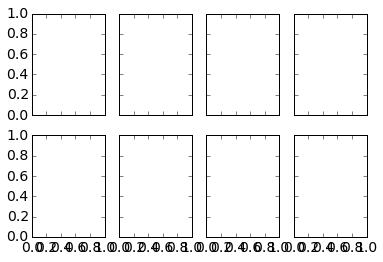

In [225]:
plot_lv(pert_100,'theta_lv_mean',1,-1,7,cmocean.cm.temperature)

In [ ]:
plot_lv(pert_100,'salt_lv_mean',0,32,37,cmocean.cm.salinity)
plot_lv(pert_70,'salt_lv_mean',0,32,37,cmocean.cm.salinity)

In [ ]:
plot_lv(pert_100,'rho_lv_mean',0,1026,1040,cmocean.cm.density)
plot_lv(pert_70,'rho_lv_mean',0,1026,1040,cmocean.cm.density)

In [ ]:
plot_lv(pert_100,'ke_lv_mean',0,0,0.05,cmocean.cm.chlorophyll)
plot_lv(pert_70,'ke_lv_mean',0,0,0.05,cmocean.cm.chlorophyll)

In [ ]:
plot_lv(pert_100,'uvel_lv_mean',0,-0.01,0.01,cmocean.cm.velocity)
plot_lv(pert_70,'uvel_lv_mean',0,-0.01,0.01,cmocean.cm.velocity)

In [ ]:
plot_lv(pert_100,'vvel_lv_mean',0,-0.01,0.01,cmocean.cm.velocity)
plot_lv(pert_70,'vvel_lv_mean',0,-0.01,0.01,cmocean.cm.velocity)

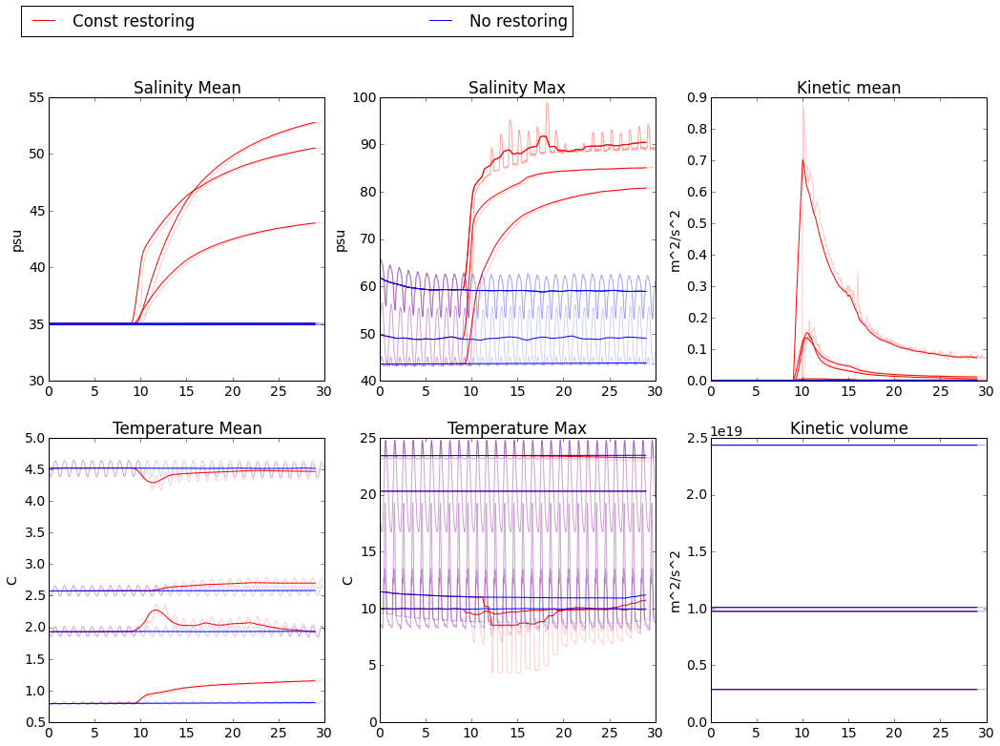

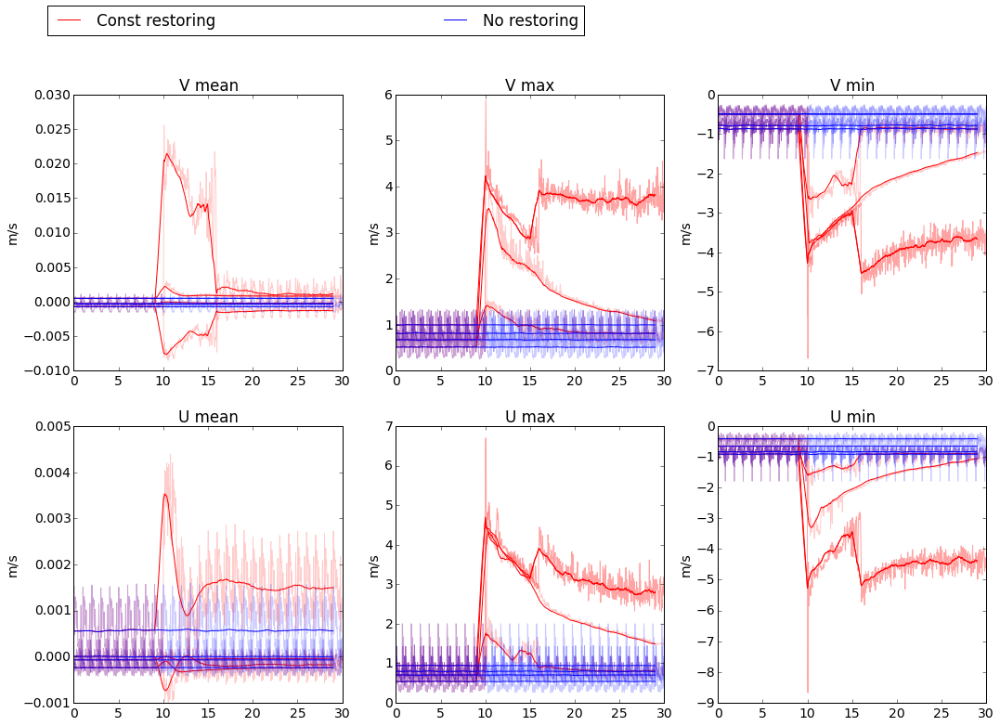

In [226]:
plot_dynSt(pert_100,['salt_mean','salt_max','ke_mean','theta_mean','theta_max','ke_vol'],'all')
plot_dynSt(pert_100,['vvel_mean','vvel_max','vvel_min','uvel_mean','uvel_max','uvel_min'],'all')

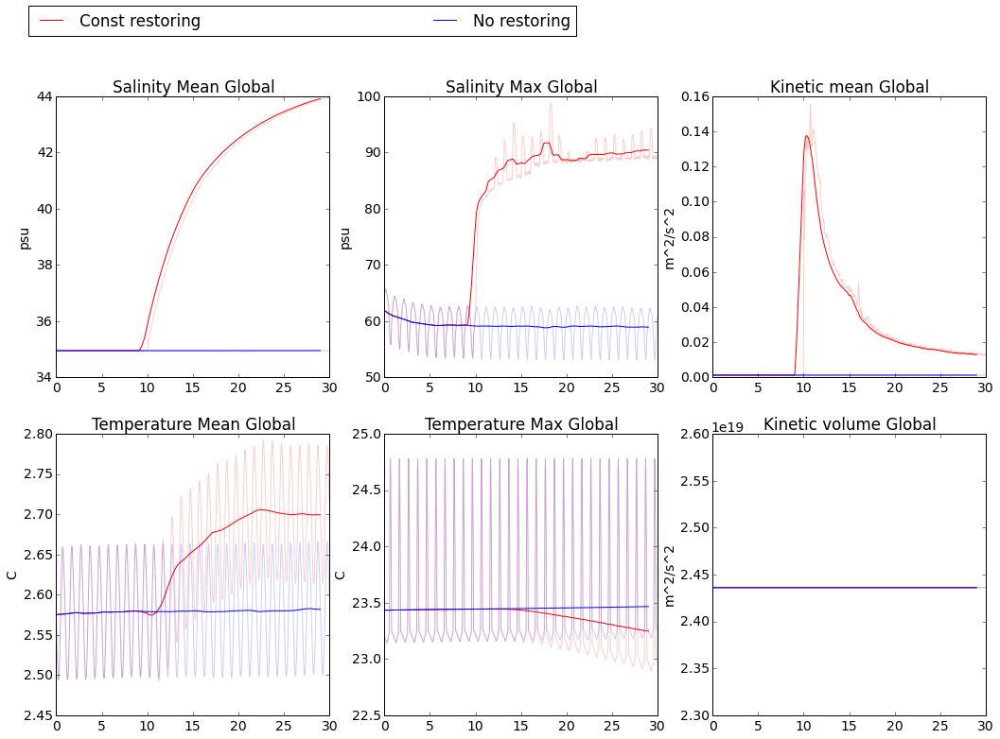

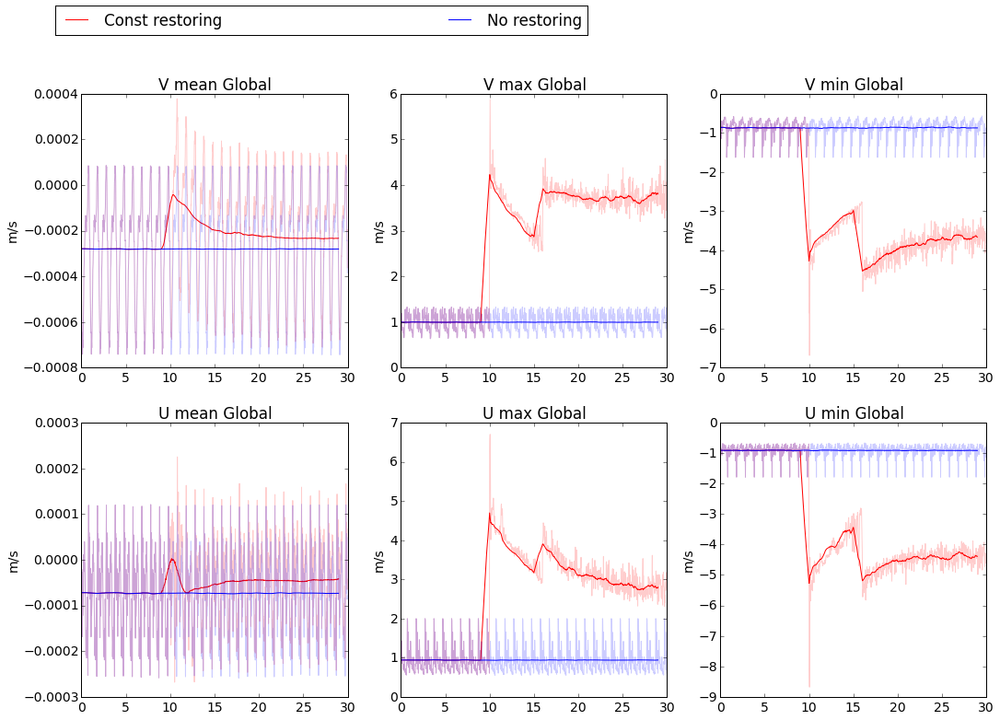

In [227]:
plot_dynSt(pert_100,['salt_mean','salt_max','ke_mean','theta_mean','theta_max','ke_vol'],0)
plot_dynSt(pert_100,['vvel_mean','vvel_max','vvel_min','uvel_mean','uvel_max','uvel_min'],0)

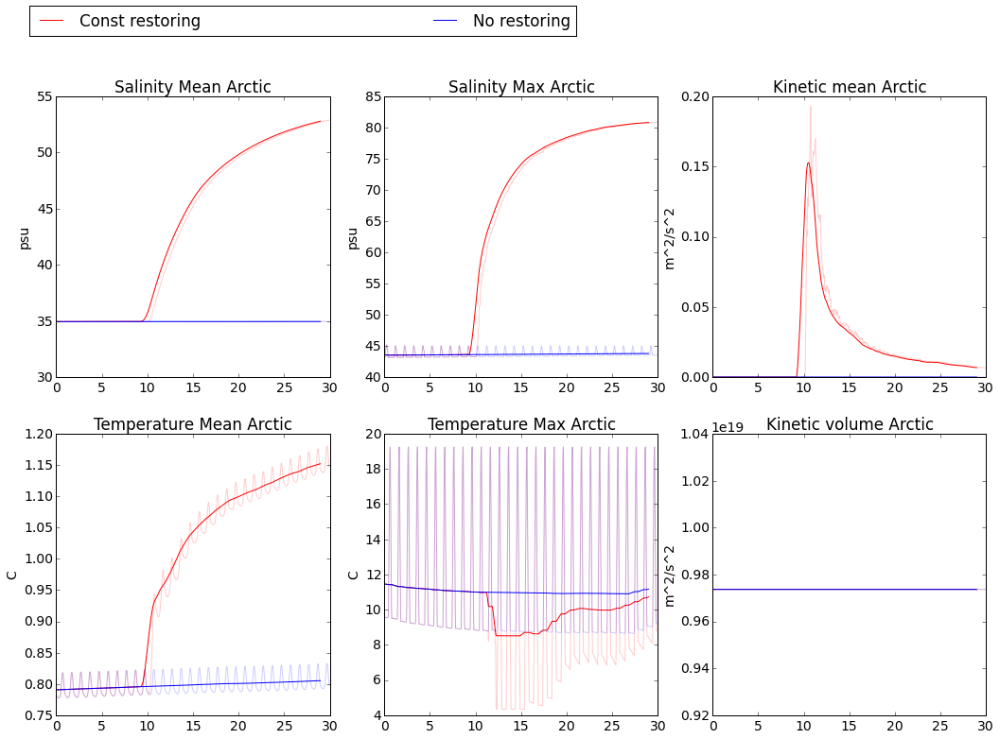

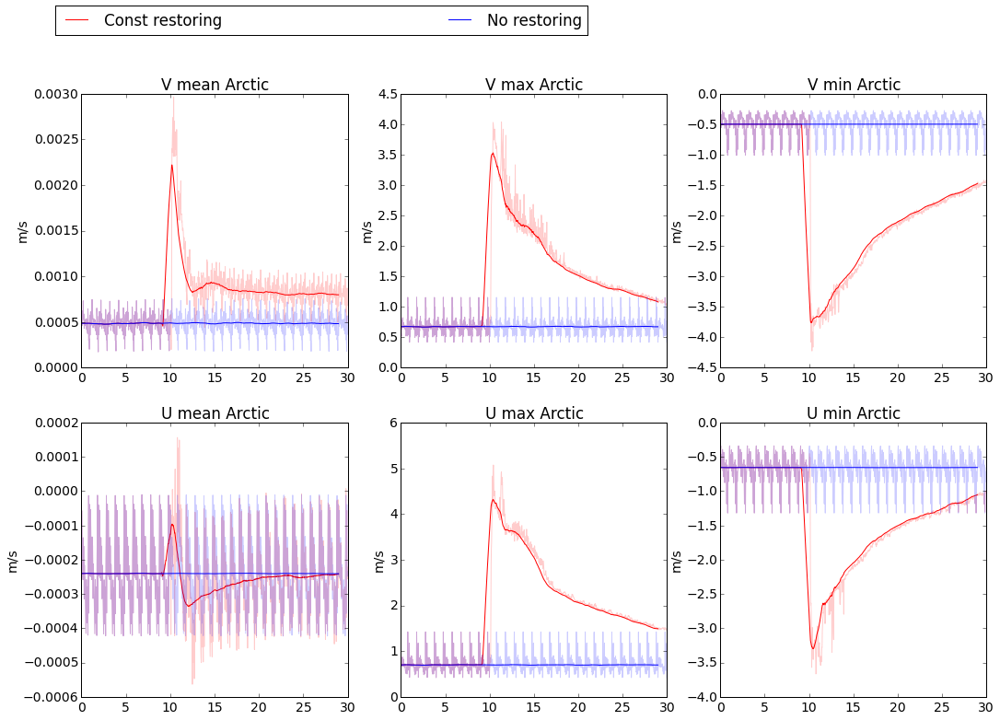

In [228]:
plot_dynSt(pert_100,['salt_mean','salt_max','ke_mean','theta_mean','theta_max','ke_vol'],1)
plot_dynSt(pert_100,['vvel_mean','vvel_max','vvel_min','uvel_mean','uvel_max','uvel_min'],1)

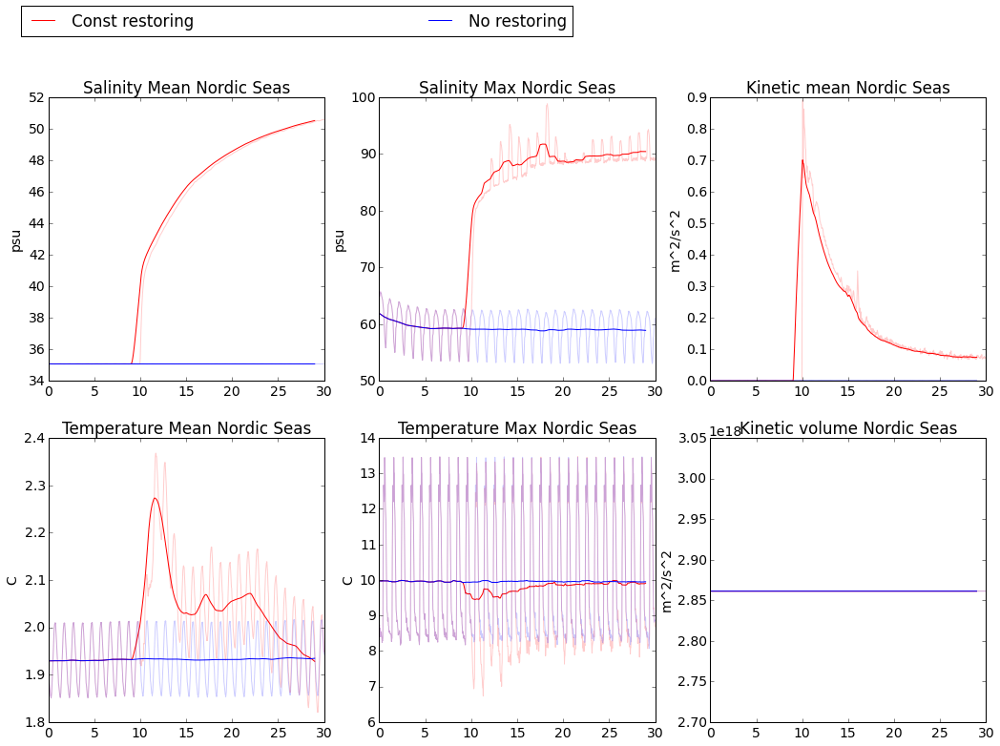

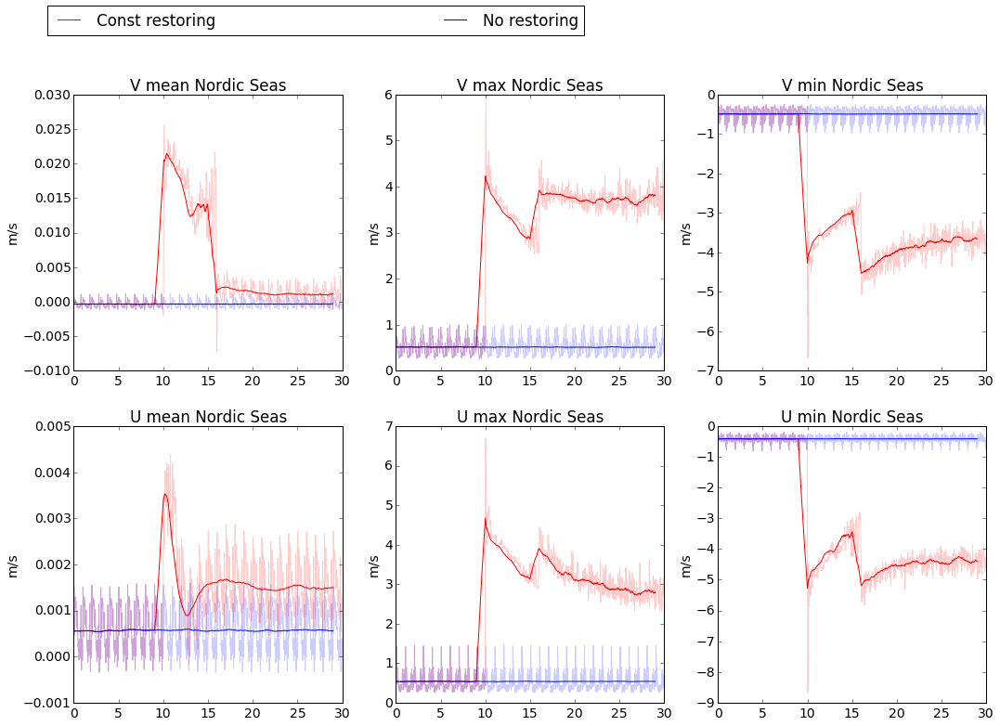

In [229]:
plot_dynSt(pert_100,['salt_mean','salt_max','ke_mean','theta_mean','theta_max','ke_vol'],2)
plot_dynSt(pert_100,['vvel_mean','vvel_max','vvel_min','uvel_mean','uvel_max','uvel_min'],2)

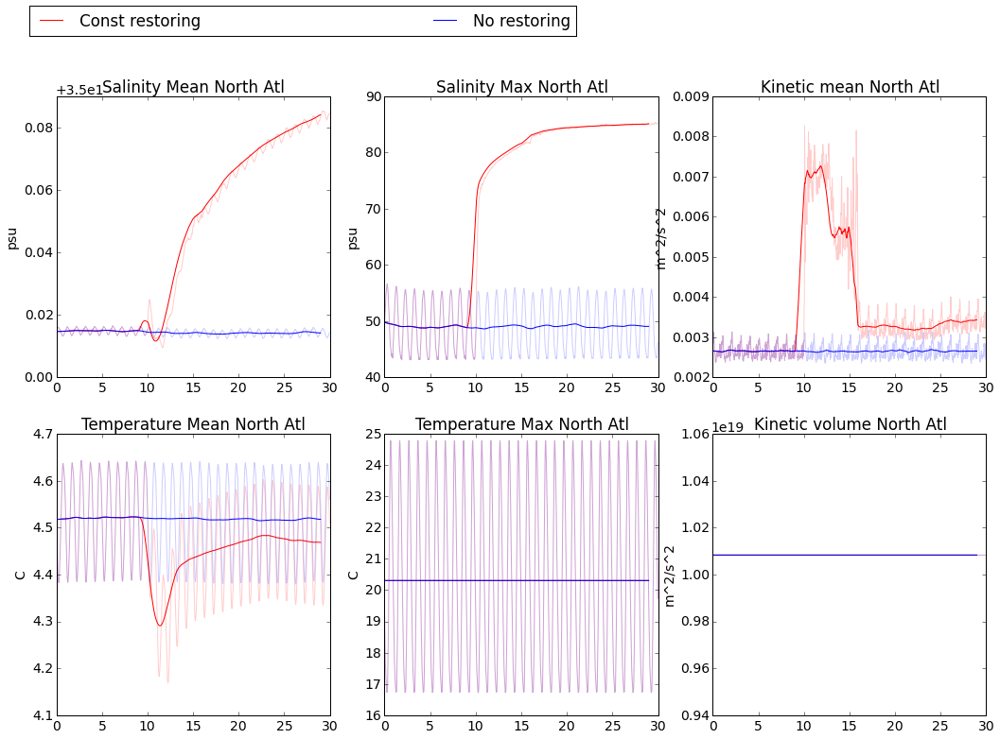

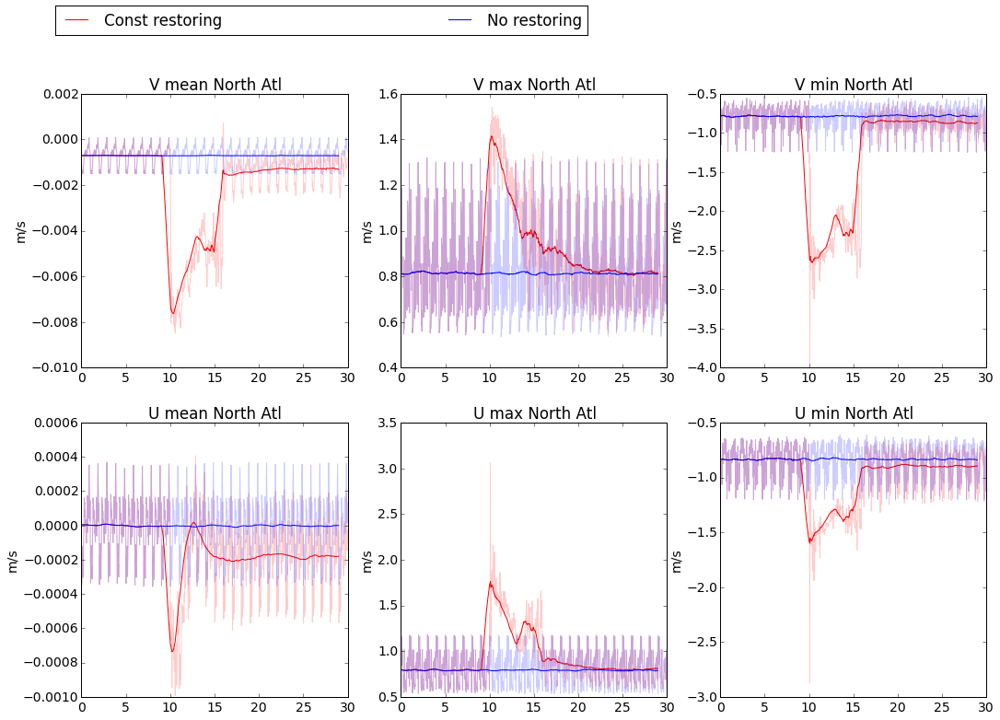

In [230]:
plot_dynSt(pert_100,['salt_mean','salt_max','ke_mean','theta_mean','theta_max','ke_vol'],3)
plot_dynSt(pert_100,['vvel_mean','vvel_max','vvel_min','uvel_mean','uvel_max','uvel_min'],3)

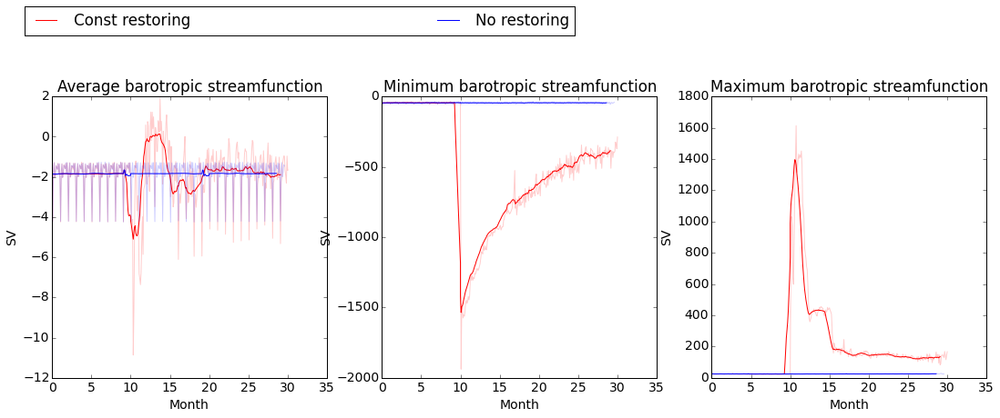

In [231]:
plot_psi(pert_100,-1,7,matplotlib.cm.jet)

AttributeError: RunRead instance has no attribute 'mxldepth_years'

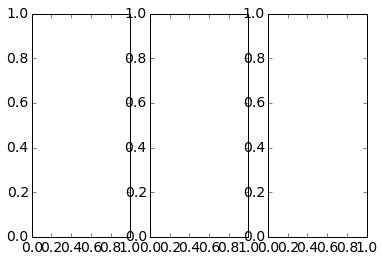

In [232]:
plot_mxldepth(pert_100,0)
plot_mxldepth(pert_100,1)
plot_mxldepth(pert_100,2)
plot_mxldepth(pert_100,3)

In [ ]:
monitor = {'pert_const' : pert_const , 'CORE_spinup_tocompare' : CORE_spinup_tocompare}

In [ ]:
fig, axes = plt.subplots(2,2)
for mon in monitor:
    for i in range(4):
        for j in range(44):
            axes.flat[i].plot(monitor[mon].dataDyn['theta_lv_mean'][1:,i,j],\
                          monitor[mon].dataDyn['salt_lv_mean'][1:,i,j],\
                               color=monitor[mon].color,alpha=(j+10)/float(60))
            axes.flat[i].set_title(region[i])
            if j == 40 and i == 1:
                axes.flat[i].plot(monitor[mon].dataDyn['theta_lv_mean'][1:,i,j],\
                          monitor[mon].dataDyn['salt_lv_mean'][1:,i,j],\
                        color=monitor[mon].color,alpha=(j+10)/float(60), label = monitor[mon].title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
fig.subplots_adjust(right=2.4,top=2.1)

In [ ]:
varlist = ['Fram1' , 'Bering' , 'Barents1','Davis1','Denmark','Norwice']
plot_flux_in_out(pert,varlist,'FluxSum',row=2,col=3)

In [ ]:
varlist = ['Fram1' , 'Bering' , 'Barents1','Davis1','Denmark','Norwice']
plot_flux(pert,varlist,'FluxSum')

In [ ]:
plot_flux(pert,varlist,'FluxInSum')

In [ ]:
plot_flux(pert,varlist,'FluxOutSum')

In [ ]:
plot_flux(pert,varlist,'FluxSumS')

In [ ]:
plot_flux(pert,varlist,'FluxSumT')

In [ ]:
plot_flux(pert,varlist,'FluxSumFW')

In [ ]:
varlist = ['Fram1' , 'Bering' , 'Barents1','Davis1','Denmark','Norwice']
plot_flux_total(pert,varlist,row=2,col=3)

In [ ]:
# this plots the sums of various flows
def plot_total_flux(monitor_list,var_list,flux,row=2,col=2):
    # this function is meant to plot monitor variables   
    fig, axes = plt.subplots(row,col)
    ax_ind = 0
    for mon in monitor_list:
        sumtoplot = 0
        for var in var_list:
            sumtoplot = sumtoplot + monitor_list[mon].fluxes[var][flux]
        
        
            axes.flat[ax_ind].plot(monitor_list[mon].fluxes['years'],sumtoplot,\
                                monitor_list[mon].color,alpha=0.3)
            
            axes.flat[ax_ind].plot(monitor_list[mon].fluxes['years'][0:-12],\
                    runningMeanFast(sumtoplot,12)[0:-12],\
                               monitor_list[mon].color,label = monitor_list[mon].title)
        axes.flat[ax_ind].set_title(monitor_list[mon].title)
        axes.flat[ax_ind].set_ylabel('Sv')
        axes.flat[ax_ind].set_xlabel('Yers')
        ax_ind += 1
    #plt.legend(bbox_to_anchor=(-2.5, 1.02, 2., 1.5),
    #               ncol=4, mode="expand", borderaxespad=0.)
    fig.subplots_adjust(right=2.4,top=2.4)

plot_total_flux(pert_100,varlist,'FluxSum')

In [ ]:
grid = grid_read(36)

In [ ]:
def interact(field,cmap1,vimin1,vimin2,vimax1,vimax2,time1,time2):
    def plot_field2(vimin=1,vimax=20,time=0,Z=0):
        # This function plots a 2D field, the field is meant to have NaNs on the land place                                                
        # vimin is the minimun, vimax is the maximum, setbad is the NaN color, unity is the unity in the colorbar                          
        # cmap is a colomap                                                                                                               
        fig,axes = plt.subplots(1,1)
        masked_array = np.ma.array(field[time,Z,:,:], mask=np.isnan(field[time,Z,:,:]))
        cmap= cmap1
        cmap.set_bad('grey',1.)
        ca = plt.imshow(masked_array,vmin = vimin, vmax = vimax, interpolation='nearest',\
                                       cmap = cmap ,origin="left",aspect='auto')
        ca = plt.pcolor(pert_const.X,pert_const.Y,masked_array,vmin = vimin, vmax = vimax,cmap = cmap)
        cbar = fig.colorbar(ca )
        fig.subplots_adjust(right=2.4,top=2)
        return plot_field2
        
    w = interactive(plot_field2,vimin=(vimin1,vimin2),vimax=(vimax1,vimax2),time=(time1,time2),Z=(time1,time2))
    display(w)
interact(pert_const.ptracers['nordicseas_50m'][:,:,:,:],matplotlib.cm.hot,-1,0,0,100,time1=0,time2=50)

In [233]:
# this function plots different angles of ptracers                                                                                  
def plot_ptracer(data,ptracer,timings):
    ax_ind = 0
    col = 3
    row = len(timings)
    fig, axes = plt.subplots(row,col)
    vimin = 0.1
    vimax = 100

    cmap= matplotlib.cm.hot
    cmap.set_bad('grey',1.)

    for t in timings:
        masked_array = np.ma.array(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=0),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=0)))
        ca = axes.flat[ax_ind*col ].imshow(masked_array,vmin = vimin, vmax = vimax, interpolation='nearest',\
                                       cmap = cmap ,origin="left",aspect='auto',norm = matplotlib.colors.LogNorm())

        masked_array = np.ma.array(np.nanmean(data.ptracers[ptracer][t,:,:,0:200],axis=1),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,0:200],axis=1)))
        ca = axes.flat[ax_ind*col +1].pcolormesh(data.X[0:200],data.Z,masked_array,vmin = vimin, vmax = vimax,cmap=cmap,
                                                 norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col+1].set_title("Perturbation "+ptracer+" after "+str(round(data.ptracers['years'][t],2))+" years")

        masked_array = np.ma.array(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=2),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=2)))
        ca = axes.flat[ax_ind*col + 2].pcolormesh(data.Y,data.Z,masked_array,vmin = vimin, vmax = vimax, cmap=cmap,
                                              norm = matplotlib.colors.LogNorm())
        cbar = fig.colorbar(ca , ax=axes.flat[ax_ind*col + 2])

        ax_ind += 1
    fig.subplots_adjust(right=2.4,top=5.8)


In [271]:
pert_iter = [0 + 10 ,2+ 10,6+ 10,9+ 10,19+ 10]

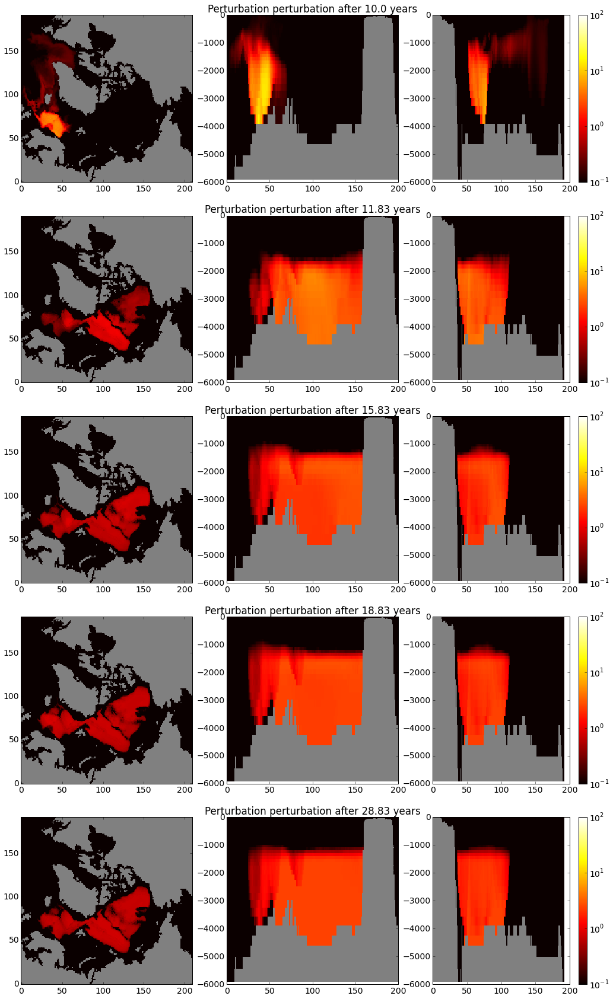

In [272]:
plot_ptracer(pert_const,'perturbation',pert_iter )

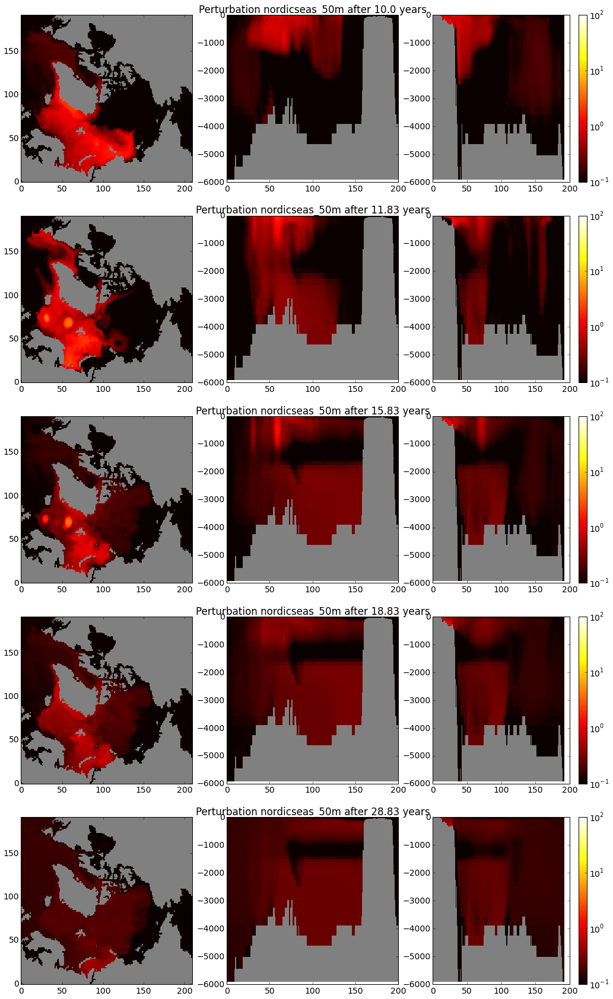

In [273]:
plot_ptracer(pert_const,'nordicseas_50m',pert_iter)

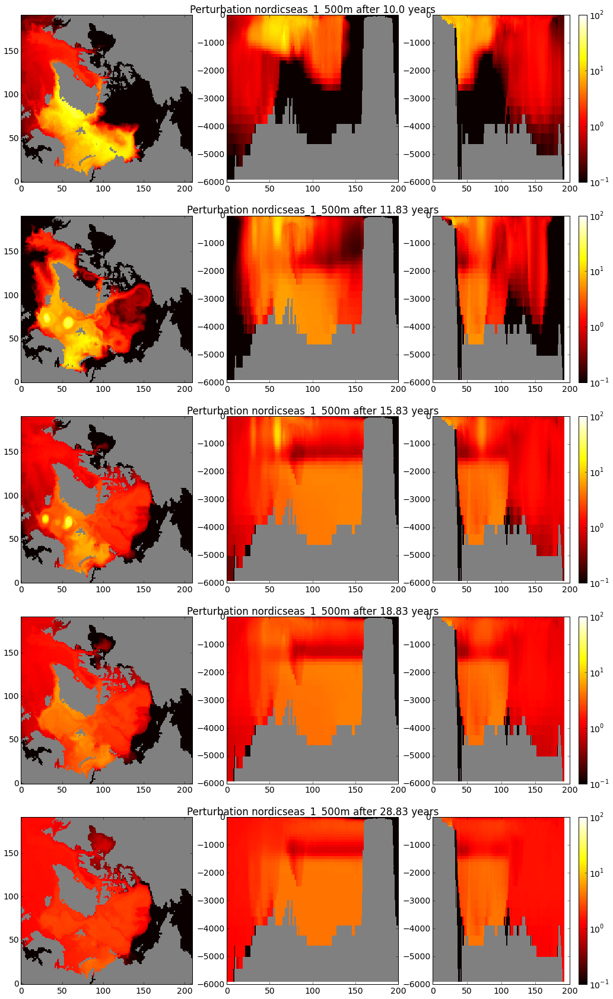

In [274]:
plot_ptracer(pert_const,'nordicseas_1_500m',pert_iter )

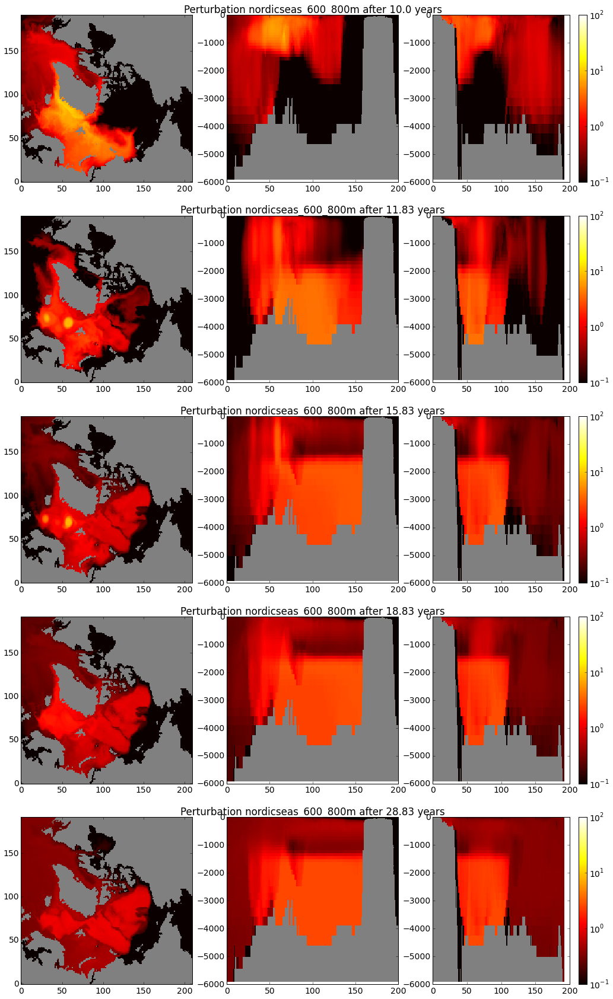

In [275]:
plot_ptracer(pert_const,'nordicseas_600_800m',pert_iter )

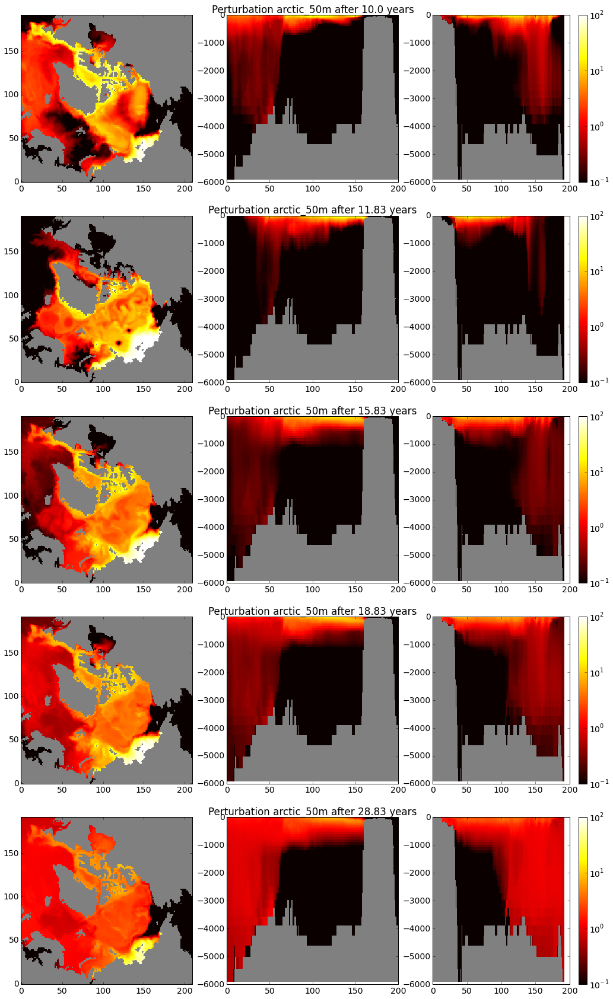

In [276]:
plot_ptracer(pert_const, 'arctic_50m',pert_iter)

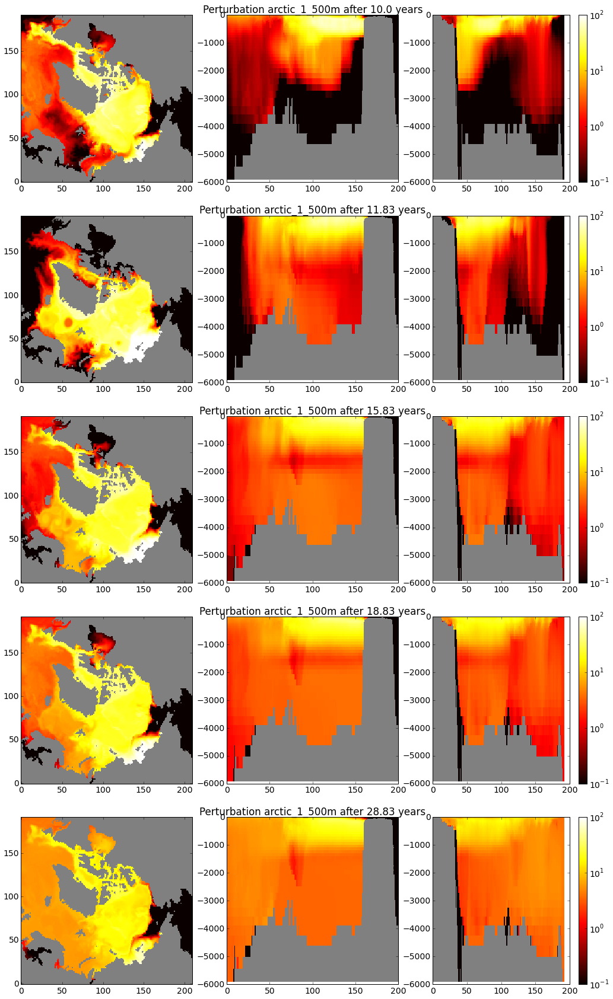

In [277]:
plot_ptracer(pert_const,'arctic_1_500m',pert_iter )

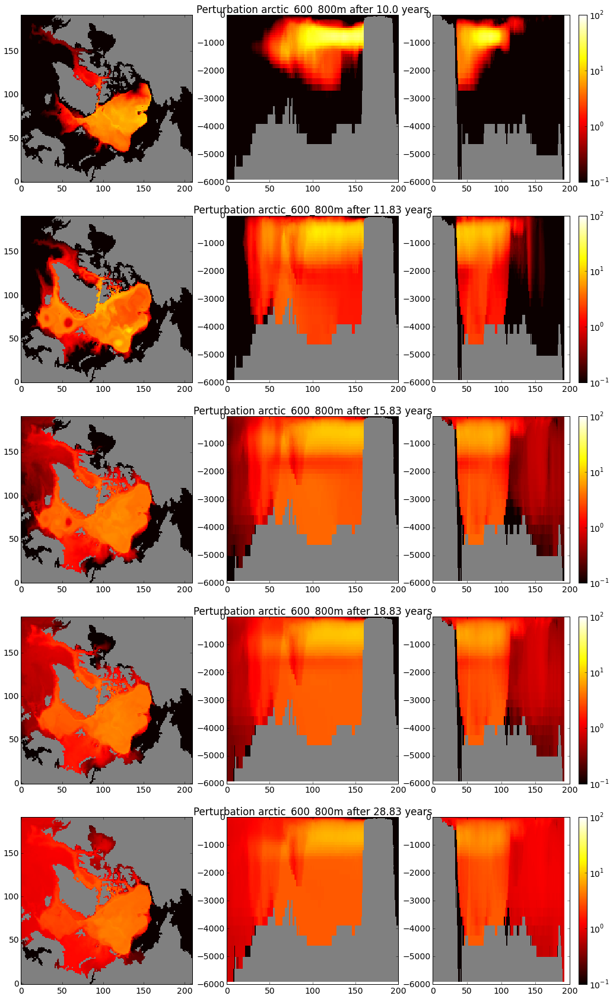

In [278]:
plot_ptracer(pert_const,'arctic_600_800m' ,pert_iter)

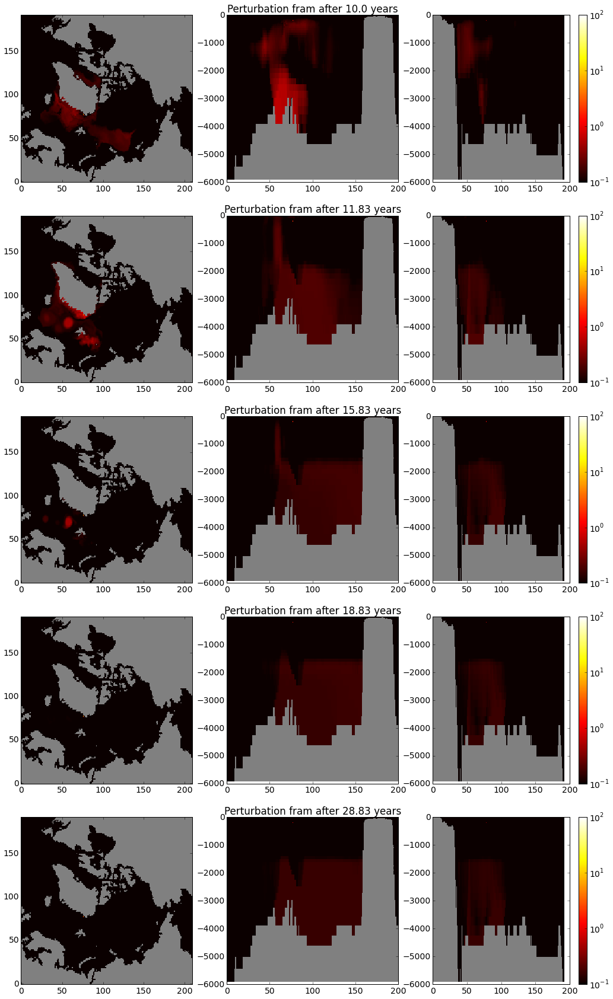

In [279]:
plot_ptracer(pert_const,'fram',pert_iter )

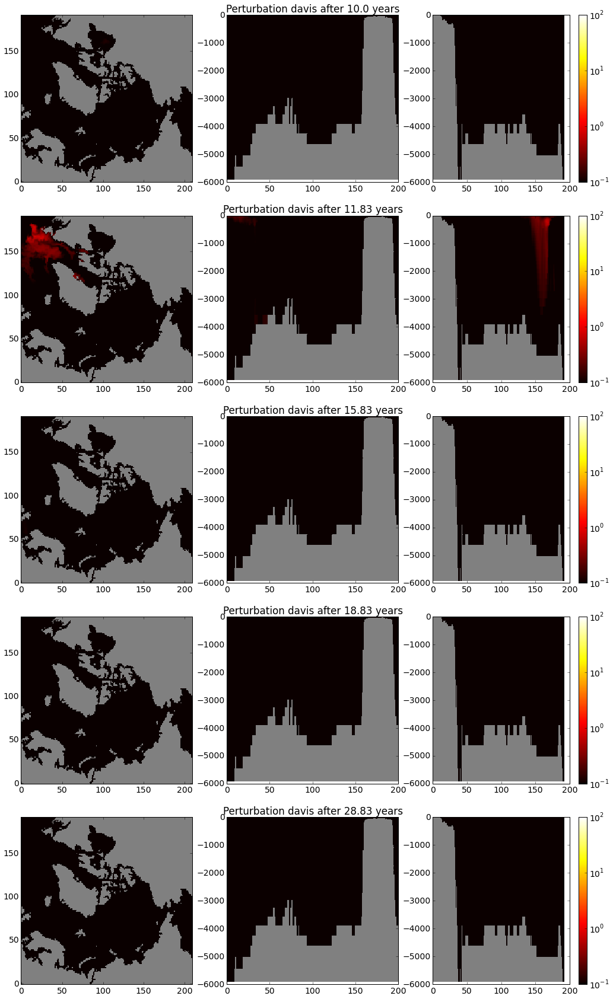

In [280]:
plot_ptracer(pert_const,'davis',pert_iter )

In [281]:
# this function plots different angles of ptracers
def plot_ptracer_diff_bench(data,data_diff,ptracer,timings):
    ax_ind = 0
    col = 3
    row = len(timings)
    fig, axes = plt.subplots(row,col)
    vimin = 0.1
    vimax = 100
    
    cmap= matplotlib.cm.hot
    cmap.set_bad('grey',1.)
    
    diff = data.ptracers[ptracer][:,:,:,:]-data_diff.ptracers[ptracer][:,:,:,:]
    diff[diff<0.001] = 0.001
    
    for t in timings:
        masked_array = np.ma.array(np.nanmean(diff[t,:,:,:],axis=0),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=0)))
        ca = axes.flat[ax_ind*col ].imshow(masked_array,vmin = vimin, vmax = vimax, interpolation='nearest',\
                                       cmap = cmap ,origin="left",aspect='auto',norm = matplotlib.colors.LogNorm())

        masked_array = np.ma.array(np.nanmean(diff[t,:,:,0:200],axis=1),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,0:200],axis=1)))
        ca = axes.flat[ax_ind*col +1].pcolormesh(data.X[0:200],data.Z,masked_array,vmin = vimin, vmax = vimax,\
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col+1].set_title("Perturbation "+ptracer+" after "+str(round(data.ptracers['years'][t],2))+" years")
        
        masked_array = np.ma.array(np.nanmean(diff[t,:,:,:],axis=2),\
                                   mask=np.isnan(np.nanmean(data.ptracers[ptracer][t,:,:,:],axis=2)))
        ca = axes.flat[ax_ind*col + 2].pcolormesh(data.Y,data.Z,masked_array,vmin = vimin, vmax = vimax,\
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        cbar = fig.colorbar(ca , ax=axes.flat[ax_ind*col + 2])
        
        ax_ind += 1 
    fig.subplots_adjust(right=2.4,top=5.8)

#plot_ptracer(pert_const,'nordicseas_50m')

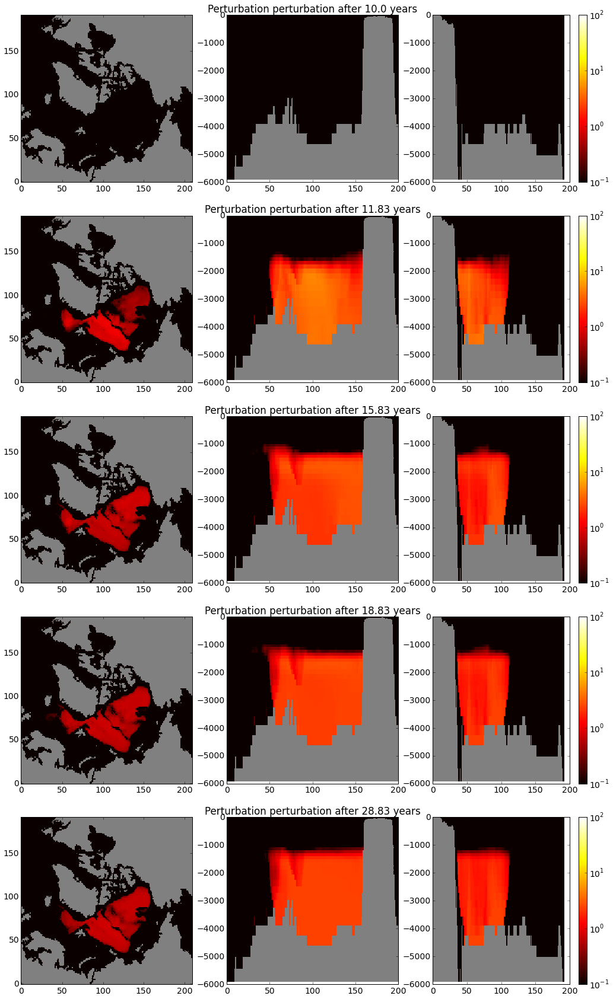

In [282]:
plot_ptracer_diff_bench(pert_const,pert_bench,'perturbation',pert_iter)

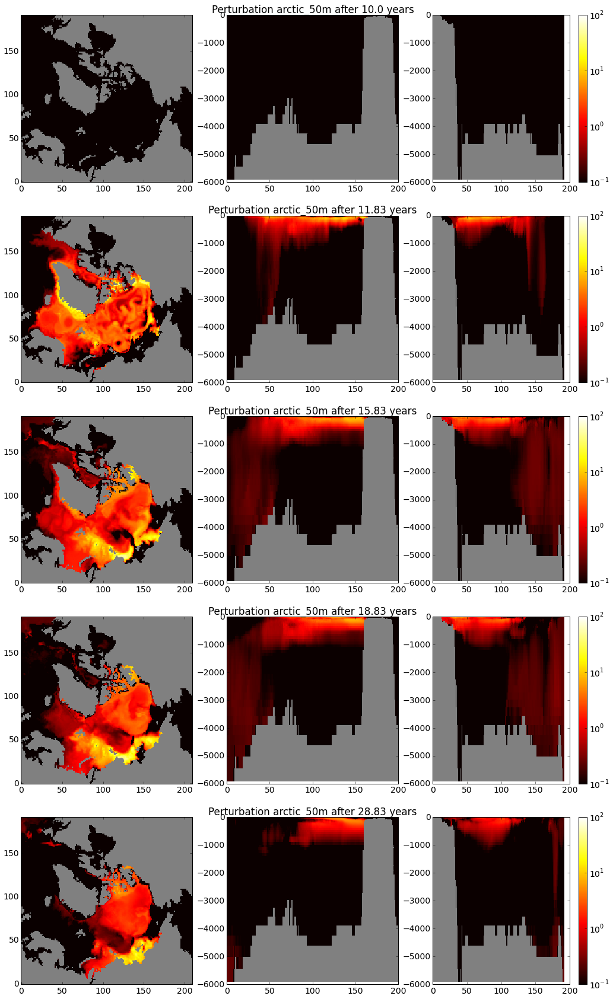

In [283]:
plot_ptracer_diff_bench(pert_const,pert_bench,'arctic_50m',pert_iter)

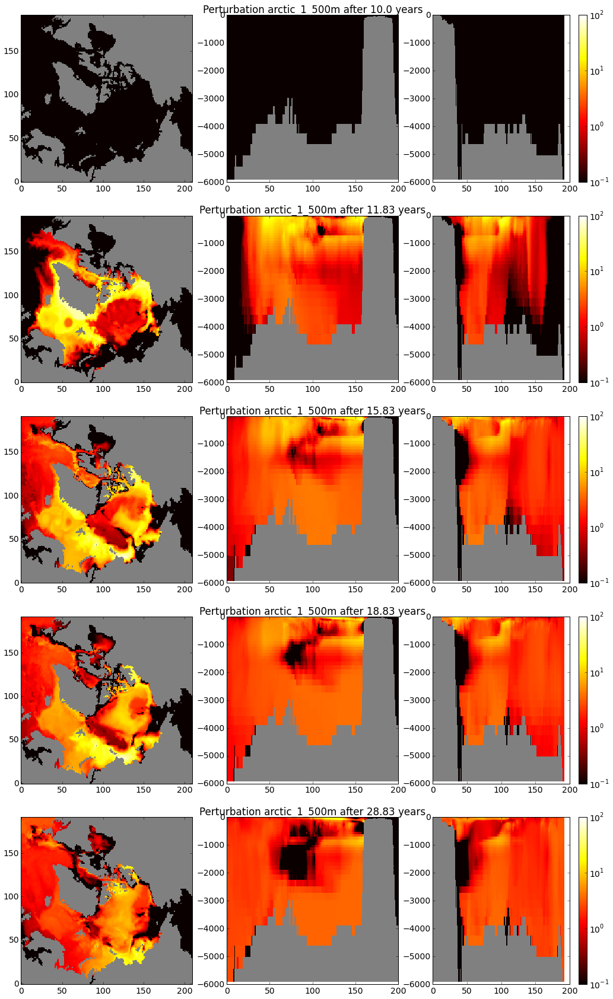

In [284]:
plot_ptracer_diff_bench(pert_const,pert_bench,'arctic_1_500m',pert_iter)

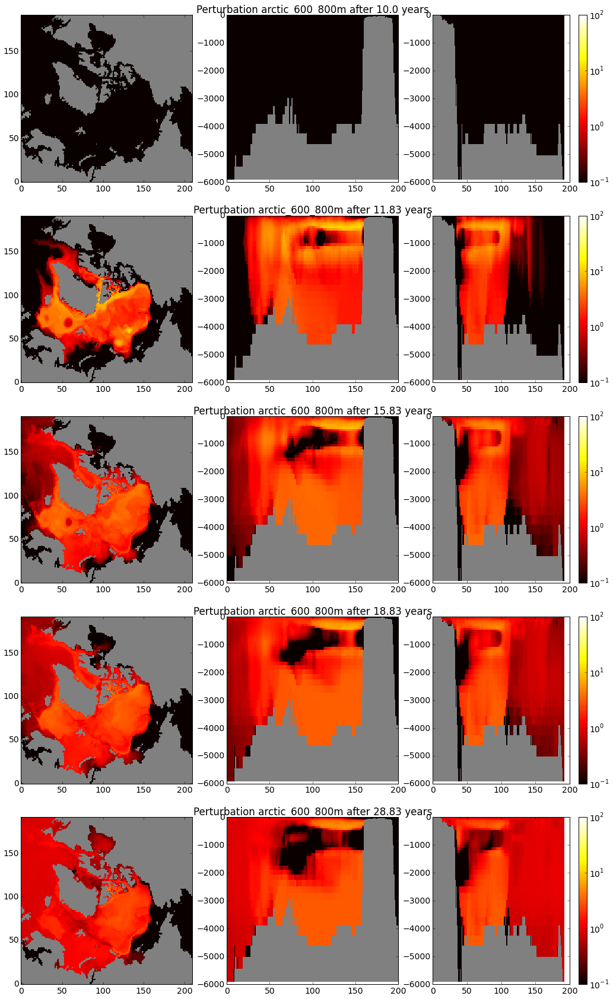

In [285]:
plot_ptracer_diff_bench(pert_const,pert_bench,'arctic_600_800m',pert_iter)

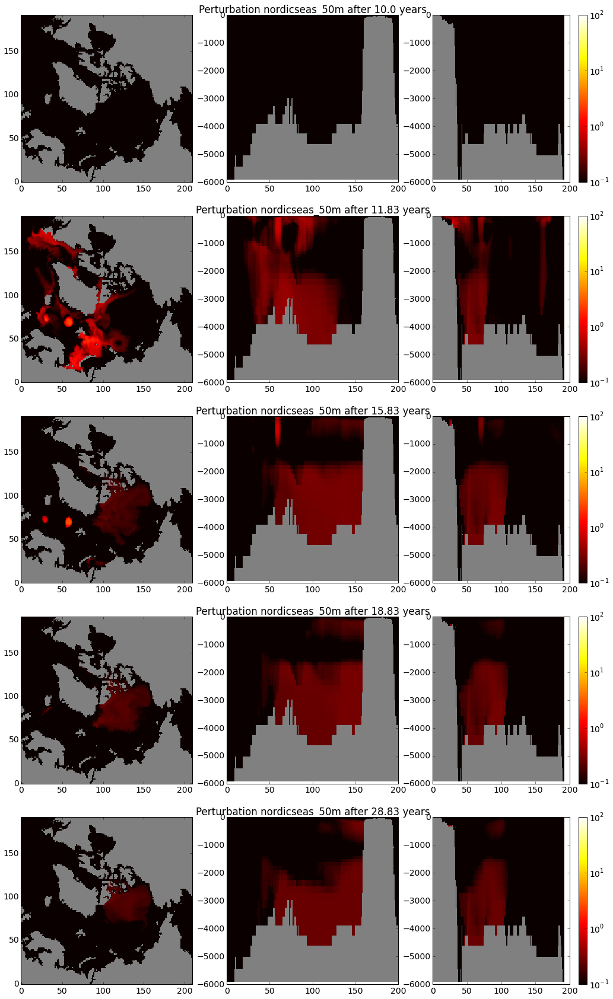

In [286]:
plot_ptracer_diff_bench(pert_const,pert_bench,'nordicseas_50m',pert_iter)

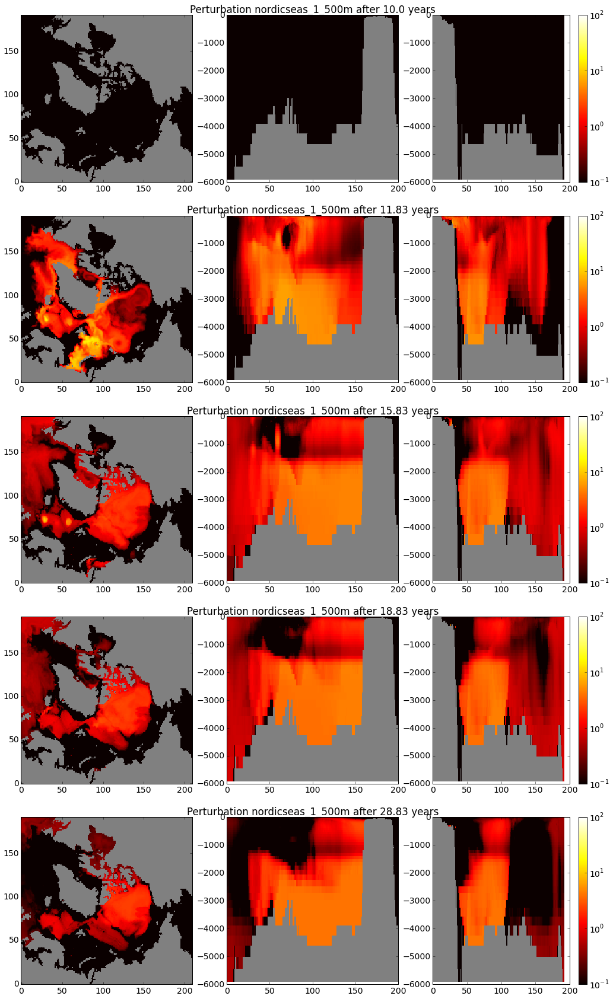

In [287]:
plot_ptracer_diff_bench(pert_const,pert_bench,'nordicseas_1_500m',pert_iter)

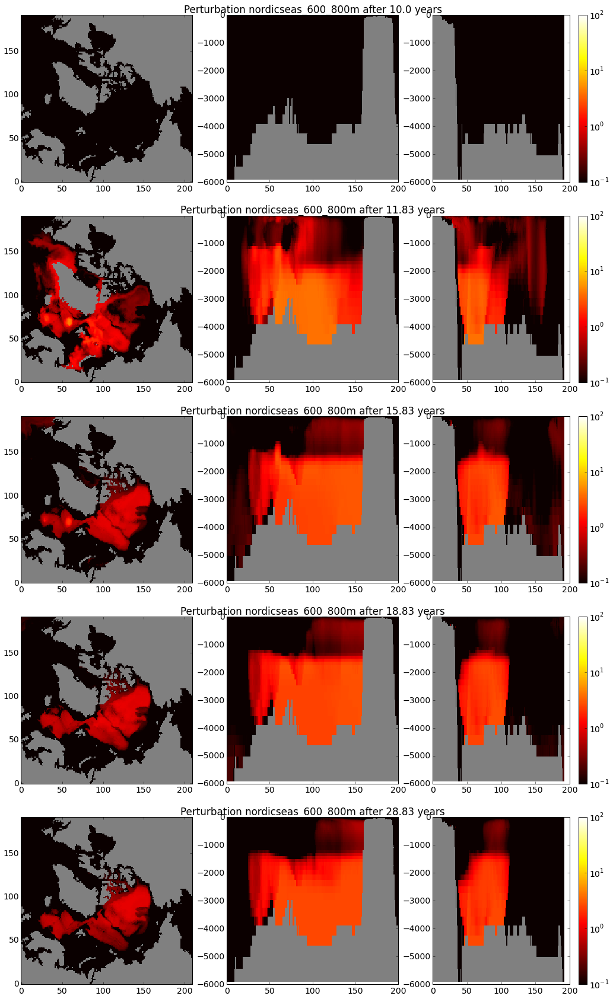

In [288]:
plot_ptracer_diff_bench(pert_const,pert_bench,'nordicseas_600_800m' ,pert_iter)

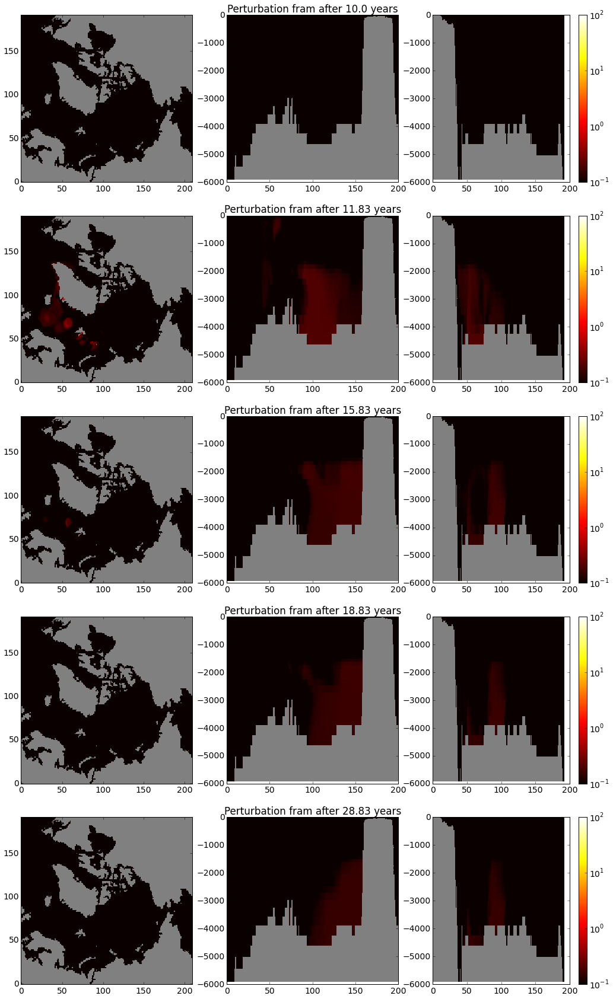

In [289]:
plot_ptracer_diff_bench(pert_const,pert_bench,'fram' ,pert_iter)

In [290]:
# this function plots different angles of ptracers
def plot_ptracer_section(data,ptracer,timings):
    ax_ind = 0
    col = 3
    row = len(timings)
    fig, axes = plt.subplots(row,col)
    vimin = 0.1
    vimax = 100
    
    cmap= matplotlib.cm.hot
    cmap.set_bad('grey',1.)
    
    for t in timings:
        masked_array = np.ma.array(data.ptracers[ptracer][t,:,70,0:150],\
                                   mask=np.isnan(data.ptracers[ptracer][t,:,70,0:150]))
        ca = axes.flat[ax_ind*col ].pcolormesh(data.X[0:150],data.Z,masked_array,vmin = vimin, vmax = vimax,
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())

        masked_array = np.ma.array(data.ptracers[ptracer][t,:,50:,40],\
                                   mask=np.isnan(data.ptracers[ptracer][t,:,50:,40]))
        ca = axes.flat[ax_ind*col +1].pcolormesh(data.Y[50:],data.Z,masked_array,vmin = vimin, vmax = vimax, 
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col+1].set_title(\
                                "Perturbation "+ptracer+" after "+str(round(data.ptracers['years'][t],2))+" years")
        
        masked_array = np.ma.array(data.ptracers[ptracer][t,:,25:120,125],\
                                   mask=np.isnan(data.ptracers[ptracer][t,:,25:120,125]))
        ca = axes.flat[ax_ind*col + 2].pcolormesh(data.Y[25:120],data.Z,masked_array,vmin = vimin, vmax = vimax,\
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        cbar = fig.colorbar(ca , ax=axes.flat[ax_ind*col + 2])
        
        ax_ind += 1 
    fig.subplots_adjust(right=2.4,top=5.8)

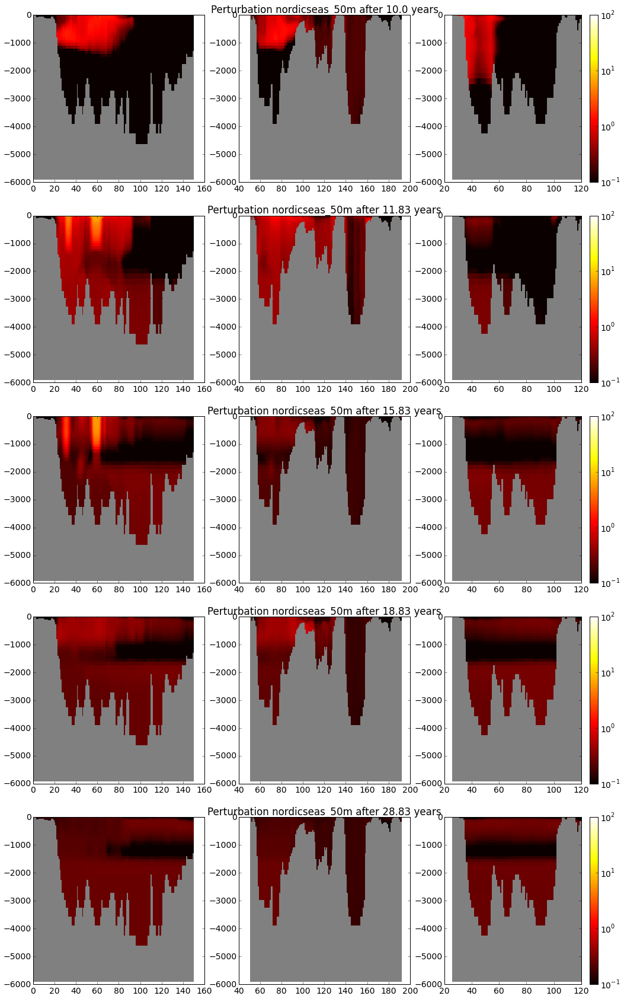

In [291]:
plot_ptracer_section(pert_const,'nordicseas_50m',pert_iter)

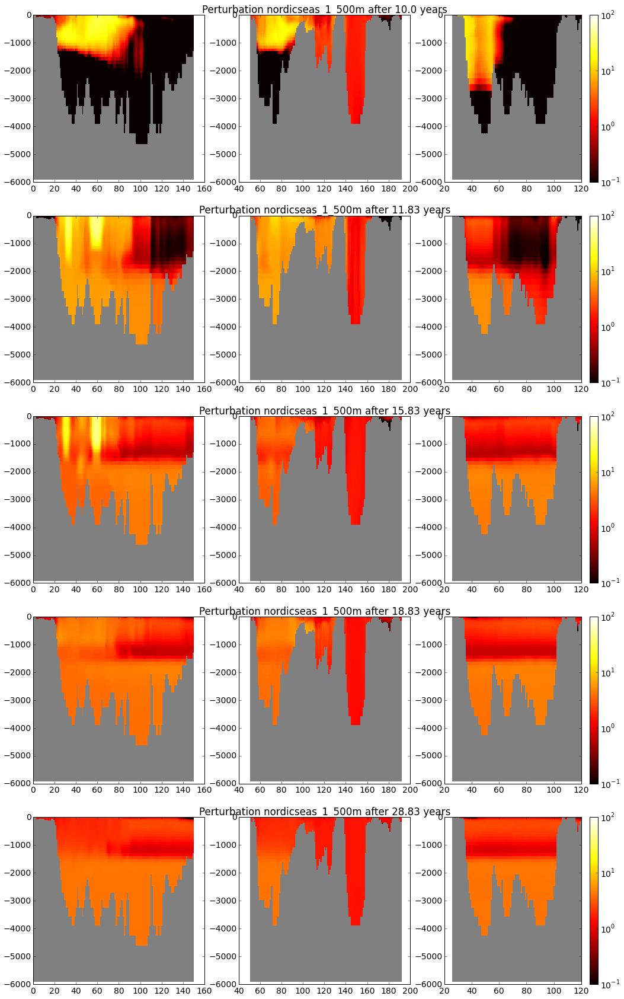

In [292]:
plot_ptracer_section(pert_const,'nordicseas_1_500m',pert_iter)

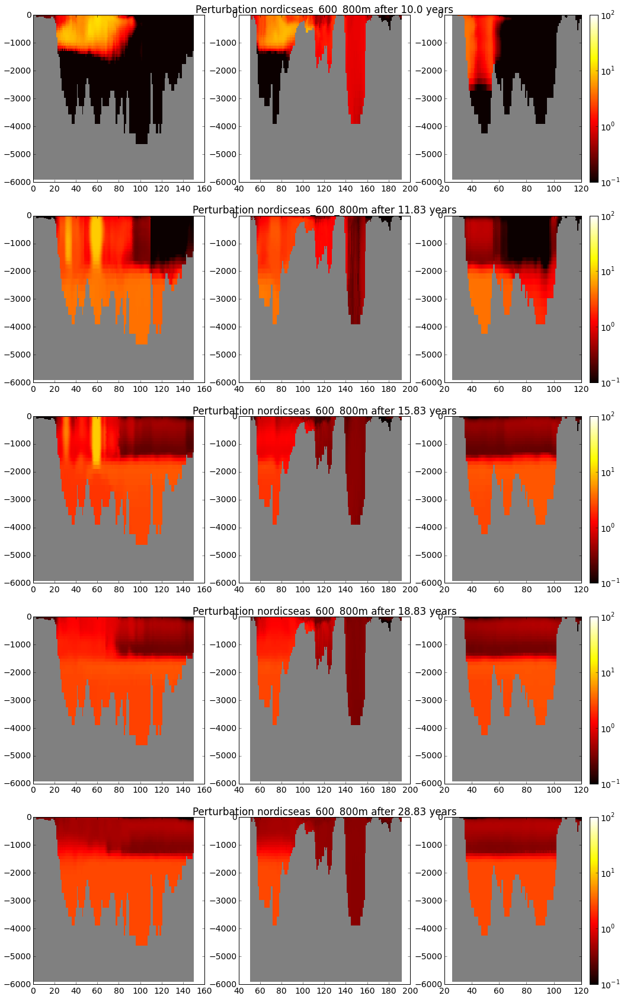

In [293]:
plot_ptracer_section(pert_const,'nordicseas_600_800m',pert_iter)

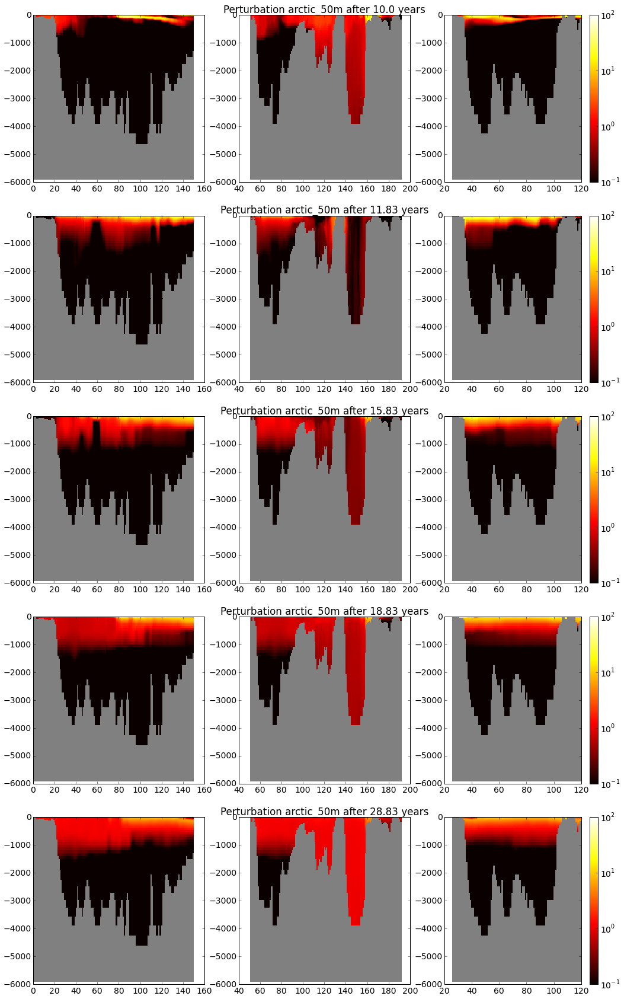

In [294]:
plot_ptracer_section(pert_const,'arctic_50m',pert_iter)

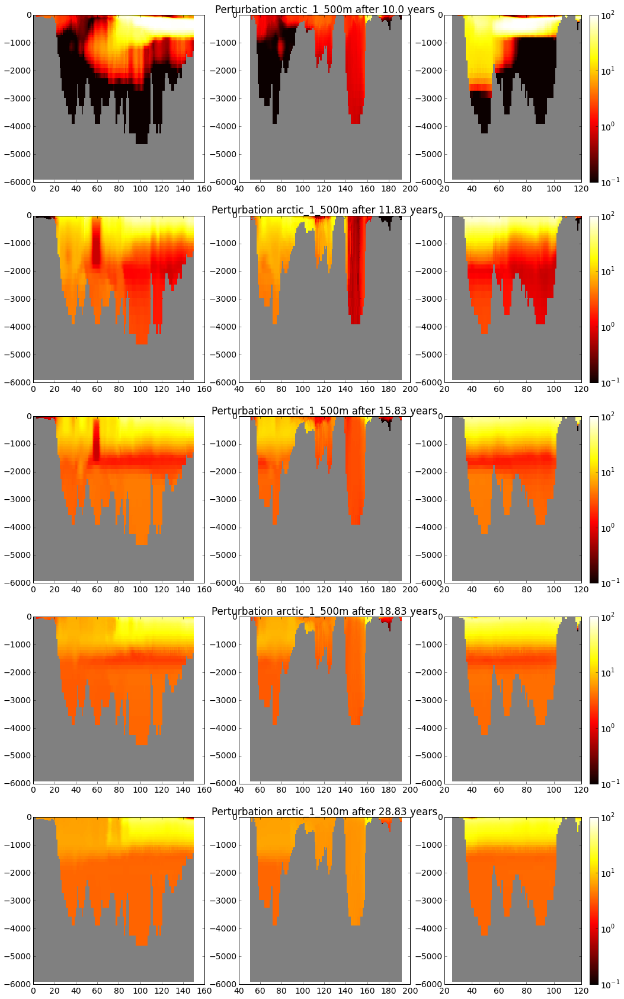

In [295]:
plot_ptracer_section(pert_const,'arctic_1_500m',pert_iter)

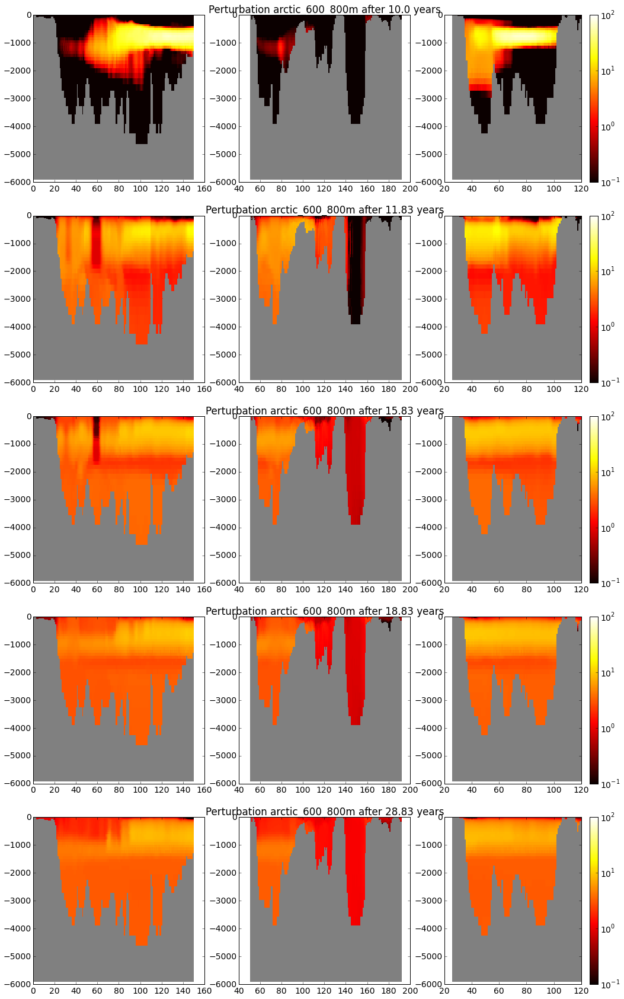

In [296]:
plot_ptracer_section(pert_const,'arctic_600_800m',pert_iter)

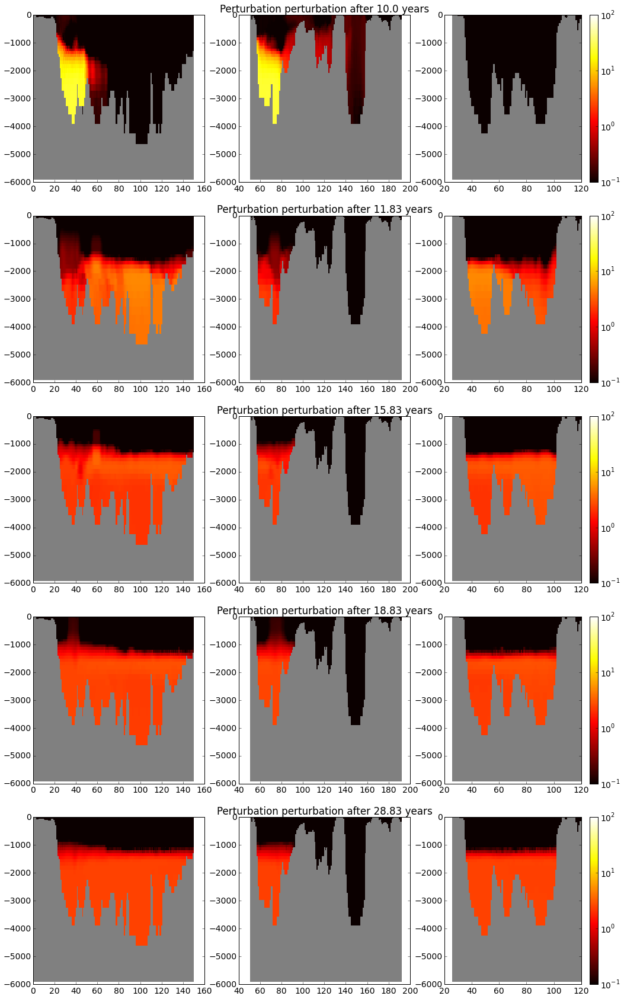

In [297]:
plot_ptracer_section(pert_const,'perturbation',pert_iter)

In [298]:
# this function plots different angles of ptracers
def plot_ptracer_fram(data,ptracer,timings):
    ax_ind = 0
    col = 3
    row = len(timings)
    fig, axes = plt.subplots(row,col)
    vimin = 0.1
    vimax = 100
    
    if data.res == 36:
        kk = 1
    elif data.res == 18:
        kk = 2
    elif data.res == 9:
        kk = 4
    
    cmap= matplotlib.cm.hot
    cmap.set_bad('grey',1.)
    
    for t in timings:
        masked_array = np.ma.array(data.ptracers[ptracer][t,0:44,60*kk:80*kk,76*kk],\
                                   mask=np.isnan(data.ptracers[ptracer][t,0:44,60*kk:80*kk,76*kk]))
        ca = axes.flat[ax_ind*col ].pcolormesh(data.Y[60*kk:80*kk],data.Z[0:44],masked_array,vmin = vimin, vmax = vimax,
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col].set_title("Fram strait "+str(round(data.ptracers['years'][t],2))+" yrs")

        masked_array = np.ma.array(data.ptracers[ptracer][t,0:30,100*kk,37*kk:48*kk],\
                                   mask=np.isnan(data.ptracers[ptracer][t,0:30,100*kk,37*kk:48*kk]))
        ca = axes.flat[ax_ind*col +1].pcolormesh(data.X[37*kk:48*kk],data.Z[0:30],masked_array,vmin = vimin, vmax = vimax, 
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col+1].set_title("Denmark strait "+str(round(data.ptracers['years'][t],2))+" yrs")
        
        masked_array = np.ma.array(np.concatenate((
                        data.ptracers[ptracer][t,0:41,45*kk:58*kk,49*kk],
                        data.ptracers[ptracer][t,0:41,58*kk,49*kk:66*kk]
                        ),axis=1),
                    mask=np.isnan(np.concatenate((
                        data.ptracers[ptracer][t,0:41,45*kk:58*kk,49*kk],
                        data.ptracers[ptracer][t,0:41,58*kk,49*kk:66*kk]
                        ),axis=1)))
        ca = axes.flat[ax_ind*col +2].pcolormesh(data.X[0*kk:30*kk],data.Z[0:41],masked_array,vmin = vimin, vmax = vimax,
                                       cmap = cmap ,norm = matplotlib.colors.LogNorm())
        axes.flat[ax_ind*col+2].set_title("Barents strait "+str(round(data.ptracers['years'][t],2))+" yrs")

        #print masked_array.shape
                
        cbar = fig.colorbar(ca , ax=axes.flat[ax_ind*col + 2])
        ax_ind += 1
    
    fig.suptitle("Tracer at "+ptracer,x=1.3,y=5.95,fontsize=18)
    fig.subplots_adjust(right=2.4,top=5.8)
    #fig.tight_layout()

In [299]:
pert_iter1 = [0 +10,1 +10,2 +10,14 +10,19 +10]

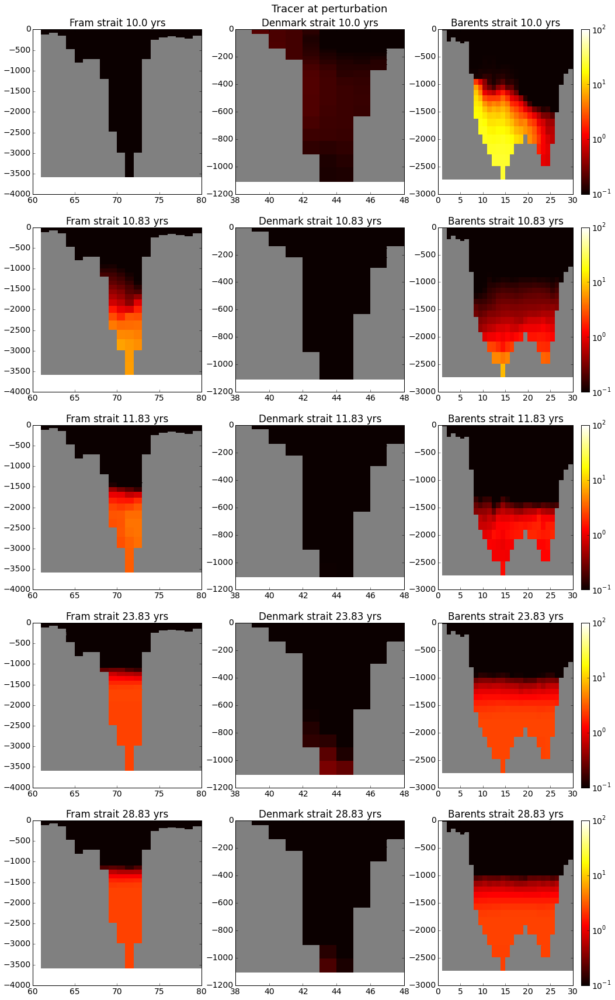

In [300]:
plot_ptracer_fram(pert_const,'perturbation',pert_iter1)

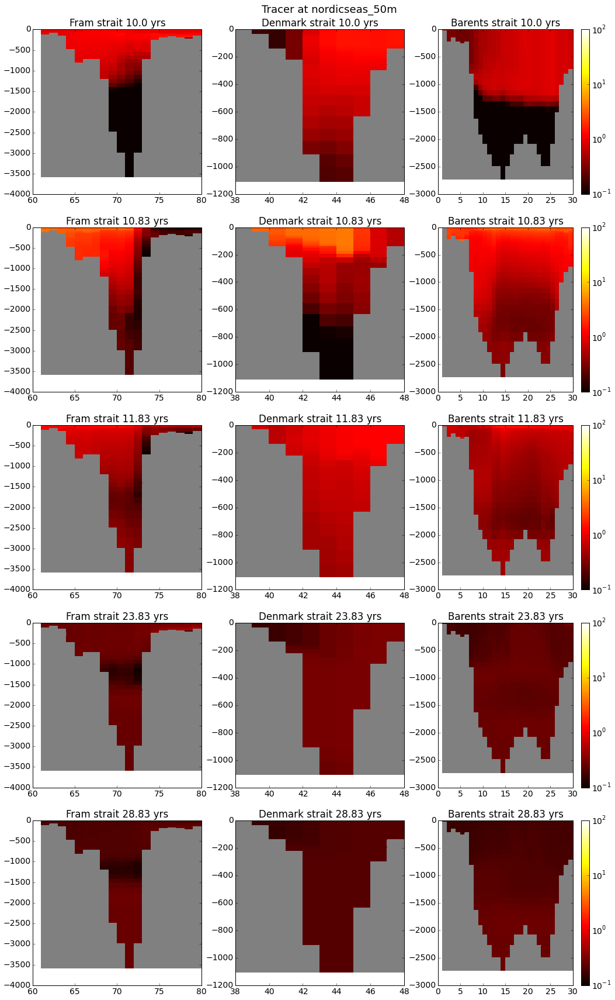

In [301]:
plot_ptracer_fram(pert_const,'nordicseas_50m',pert_iter1)

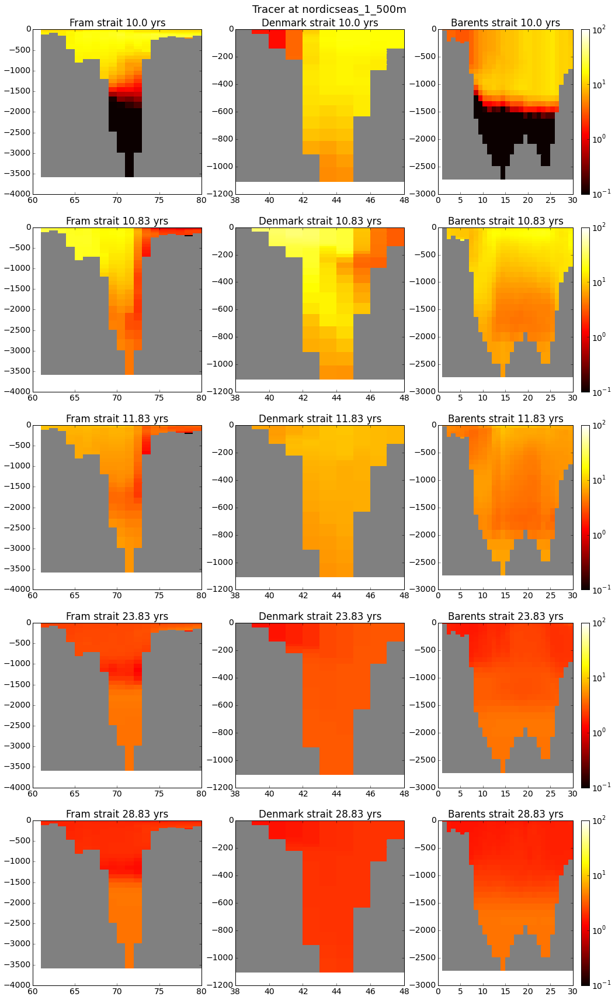

In [302]:
plot_ptracer_fram(pert_const,'nordicseas_1_500m',pert_iter1)

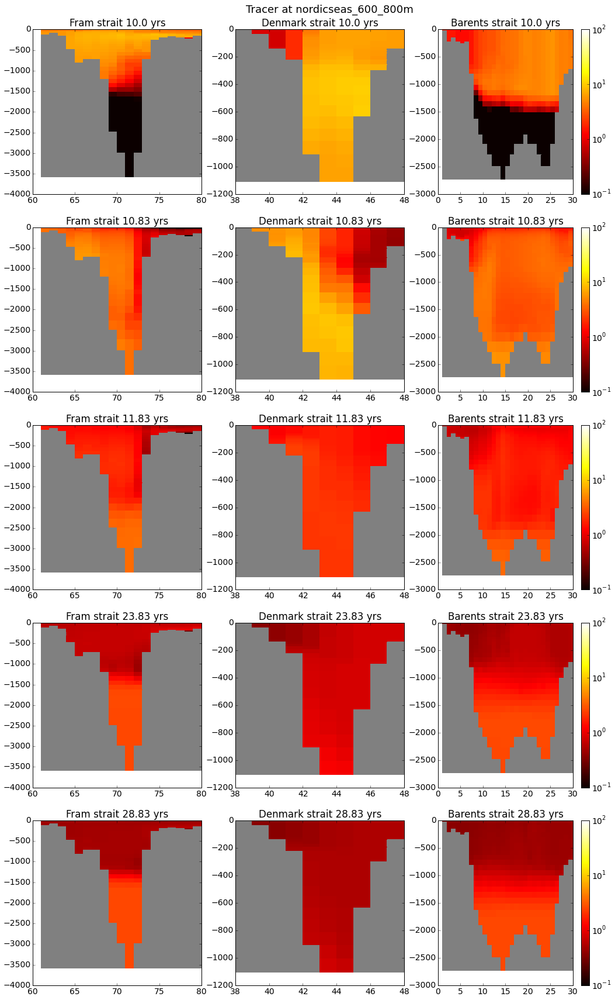

In [303]:
plot_ptracer_fram(pert_const,'nordicseas_600_800m',pert_iter1)

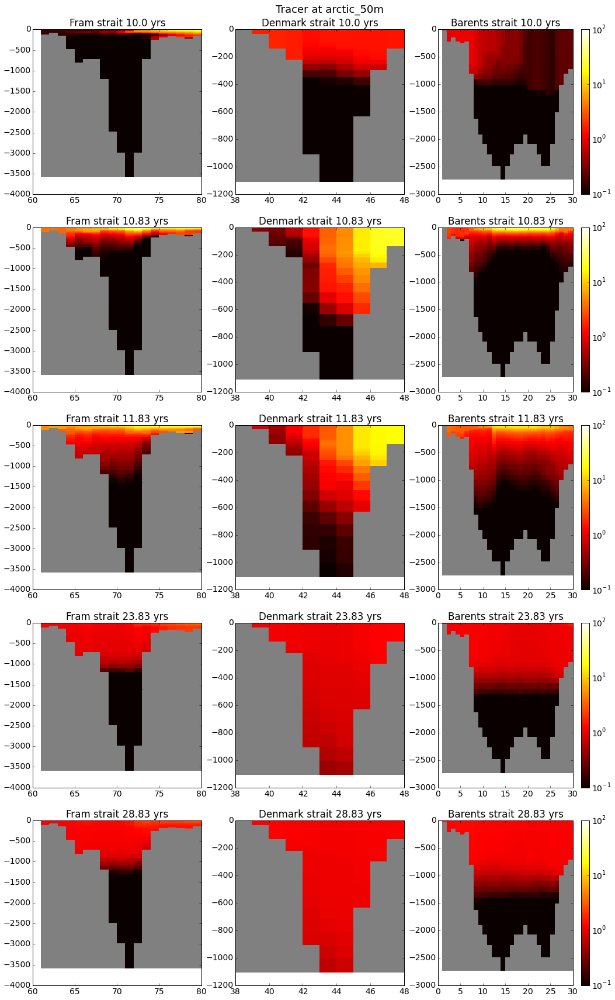

In [304]:
plot_ptracer_fram(pert_const,'arctic_50m',pert_iter1)

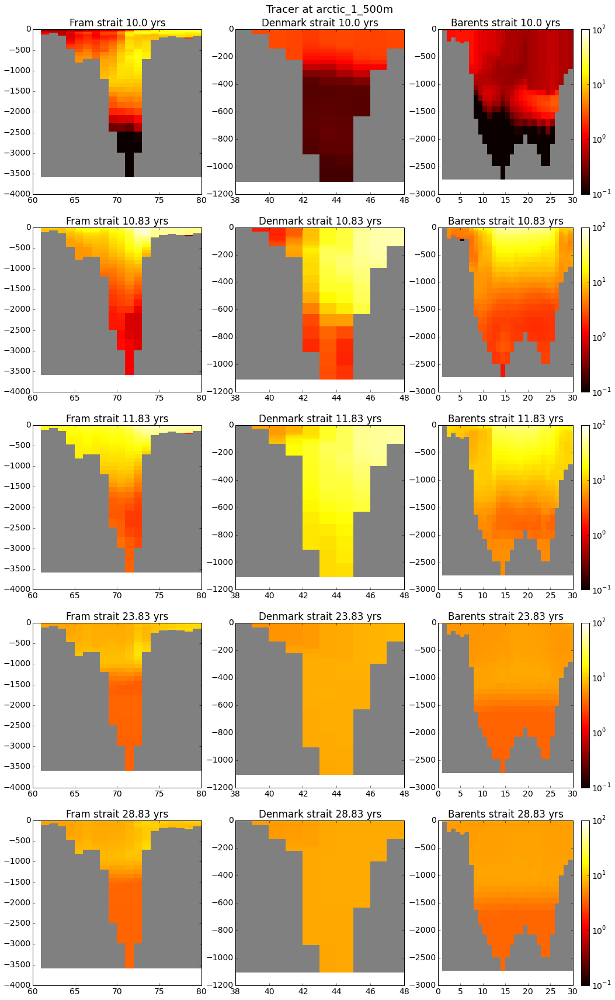

In [305]:
plot_ptracer_fram(pert_const,'arctic_1_500m',pert_iter1)

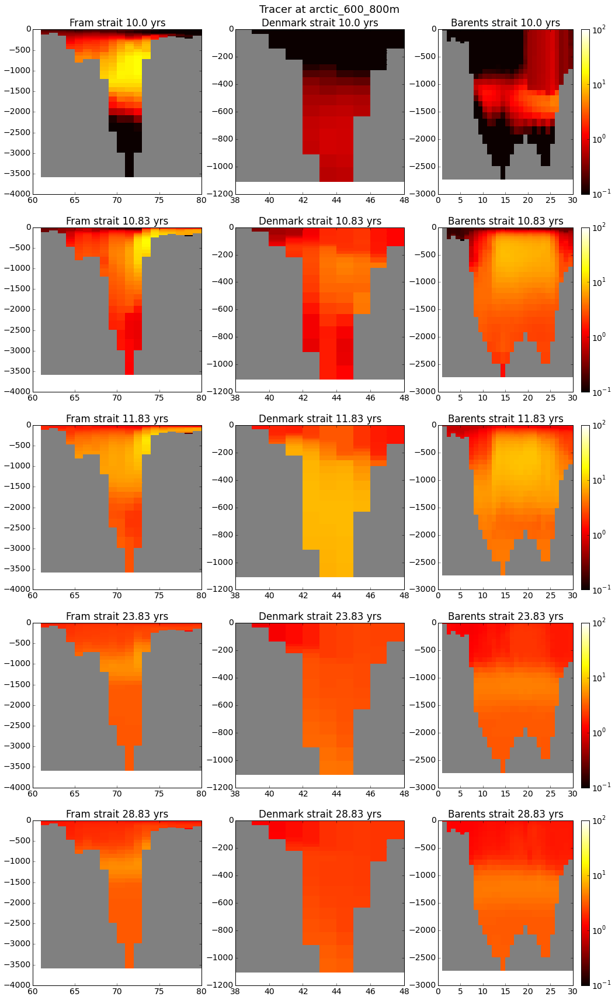

In [306]:
plot_ptracer_fram(pert_const,'arctic_600_800m',pert_iter1)

In [307]:
trac_title = {'TRAC01_lv_ave' : 'Pert' , 'TRAC02_lv_ave' :'NordSea 50' , 'TRAC03_lv_ave' : 'NordSea 1-500' ,
              'TRAC04_lv_ave' : 'NordSea 600-800' , 'TRAC05_lv_ave' : 'Arct 1-50' , 'TRAC06_lv_ave' : 'Arct 1-500' ,
              'TRAC07_lv_ave' : 'Arct 600-800' , 'TRAC08_lv_ave' : 'Fram' , 'TRAC09_lv_ave' : 'Bering' ,
              'TRAC10_lv_ave' : 'Davis' , 'TRAC11_lv_ave' : 'Denmark' , 'TRAC12_lv_ave' : 'Barents' ,
              'TRAC13_lv_ave' : 'Norwice' ,
              'TRAC01_ave' : 'Pert' , 'TRAC02_ave' :'NordSea 50' , 'TRAC03_ave' : 'NordSea 1-500' ,
              'TRAC04_ave' : 'NordSea 600-800' , 'TRAC05_ave' : 'Arct 1-50' , 'TRAC06_ave' : 'Arct 1-500' ,
              'TRAC07_ave' : 'Arct 600-800' , 'TRAC08_ave' : 'Fram' , 'TRAC09_ave' : 'Bering' ,
              'TRAC10_ave' : 'Davis' , 'TRAC11_ave' : 'Denmark' , 'TRAC12_ave' : 'Barents' ,
              'TRAC13_ave' : 'Norwice' ,}

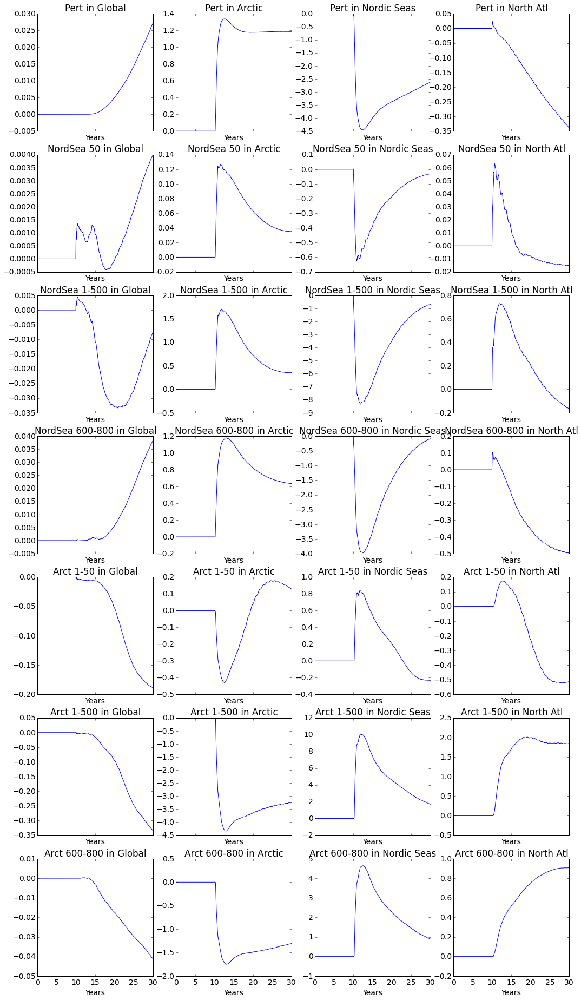

In [322]:
def plot_ptracers_1d(numtrac):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    
    col = len(reg_title)
    row = numtrac
    fig, axes = plt.subplots(nrows=row, ncols=col, sharex=True)
    ax_ind = 0 ; col_ind = 0 ;
    for j in range(1,numtrac+1,1):
        if j < 10:
            trac = 'TRAC0'+str(j)+'_ave'
        else:
            trac = 'TRAC'+str(j)+'_ave'
        for reg in range(0,4):
            ca = axes.flat[ax_ind].plot(pert_const.dataDynTracers['years'],
                    pert_const.dataDynTracers[trac][1:,reg].T - pert_bench.dataDynTracers[trac][1:,reg].T)        
            axes.flat[ax_ind].set_title(trac_title[trac]+' in '+reg_title[reg])
            axes.flat[ax_ind].set_xlabel('Years')
            #cbar = fig.colorbar(ca , ax=axes.flat[ax_ind ], ticks=ticks )
            ax_ind += 1
            
        #axes.flat[col*col_ind].set_ylabel('C')
        col_ind += 1
        
    fig.subplots_adjust(right=2.4,top=6.3)
plot_ptracers_1d(7)

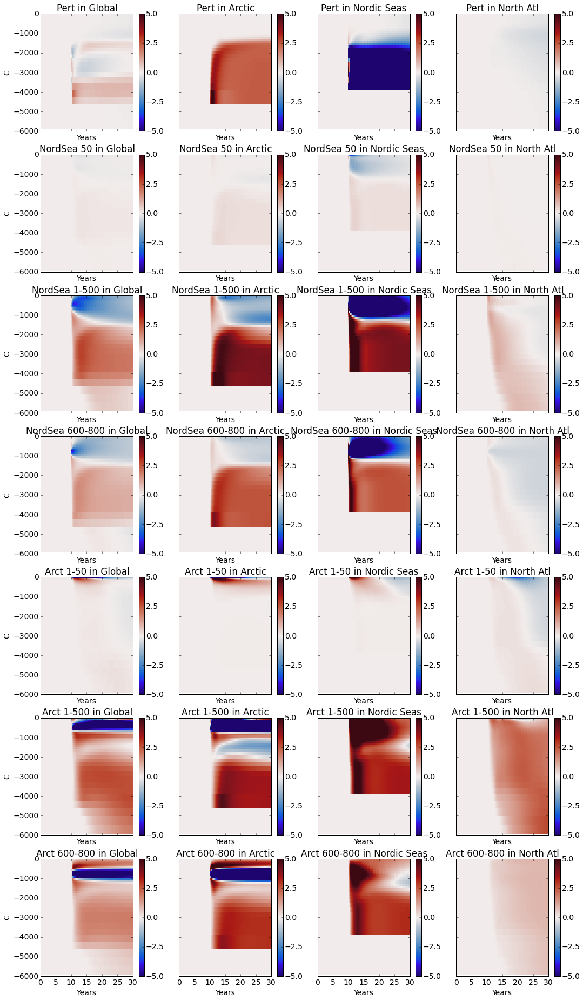

In [323]:
def plot_ptracers_lv(numtrac,vimin,vimax,cmap):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    
    col = len(reg_title)
    row = numtrac
    fig, axes = plt.subplots(nrows=row, ncols=col, sharex=True, sharey=True)
    ax_ind = 0 ; col_ind = 0 ;
    ticks = np.linspace(vimin,vimax,5)
    for j in range(1,numtrac+1,1):
        if j < 10:
            trac = 'TRAC0'+str(j)+'_lv_ave'
        else:
            trac = 'TRAC'+str(j)+'_lv_ave'
        for reg in range(0,4):
            ca = axes.flat[ax_ind].pcolor(pert_const.dataDynTracers['years'],pert_const.Z,\
                    pert_const.dataDynTracers[trac][1:,reg,:].T - pert_bench.dataDynTracers[trac][1:,reg,:].T,\
                    vmin = vimin, vmax = vimax, cmap = cmap,)        
            axes.flat[ax_ind].set_title(trac_title[trac]+' in '+reg_title[reg])
            axes.flat[ax_ind].set_xlabel('Years')
            cbar = fig.colorbar(ca , ax=axes.flat[ax_ind ], ticks=ticks )
            ax_ind += 1
            
        axes.flat[col*col_ind].set_ylabel('C')
        col_ind += 1
        
    fig.subplots_adjust(right=2.4,top=6.3)
plot_ptracers_lv(7,-5,5,cmocean.cm.freesurface)

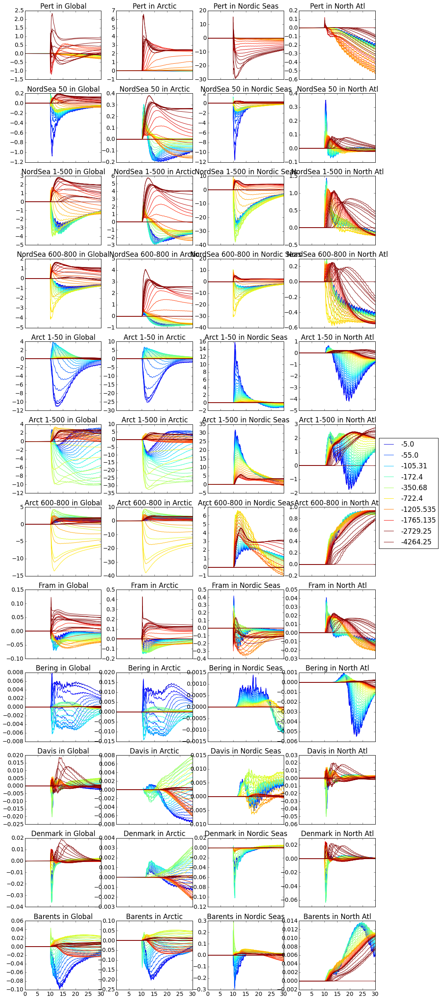

In [324]:
def plot_trac_lvs(data,diffdata,ntr):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    fig, axes = plt.subplots(ntr-1,4,sharex=True)    
    ax = 0
    for k in range(1,ntr,1):
        for r in range(0,4,1):
            if k < 10:
                trac = 'TRAC0'+str(k)+'_lv_ave'
            else:
                trac = 'TRAC'+str(k)+'_lv_ave'
            temp = data.dataDynTracers[trac][:,r,:]-diffdata.dataDynTracers[trac][:,r,:]
            for j in range(0,50,1):
                if j%5 == 0:
                    axes.flat[ax].plot(data.dataDynTracers['years'],temp[1:,j],color=matplotlib.cm.jet(j*6 + 20), label = data.Z[j])
                else:
                    axes.flat[ax].plot(data.dataDynTracers['years'],temp[1:,j],color=matplotlib.cm.jet(j*6 + 20))

            axes.flat[ax].set_title(trac_title[trac]+' in '+reg_title[r])
            ax += 1
    #fig.suptitle("Tracer diffusion in "+reg_title(reg),x=1.3,y=1.6,fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 8), loc=2, borderaxespad=0.)
    fig.subplots_adjust(right=2.1,top=8.4)

plot_trac_lvs(pert_const,pert_bench,13)

In [329]:
def layers_levels():
    levels_RHO = [ 1017.0, 1017.2, 1017.5, 1017.8, 1018.0, 1018.2, 1018.5, 1018.8, 1019.0,
           1019.2, 1019.5, 1019.8, 1020.0, 1020.2, 1020.5, 1020.8, 1021.0, 1021.2,
           1021.5, 1021.8, 1022.0, 1022.2, 1022.5, 1022.8, 1023.0, 1023.2, 1023.5,
           1023.8, 1024.0, 1024.2, 1024.5, 1024.8, 1025.0, 1025.2, 1025.5, 1025.8,
           1026.0, 1026.2, 1026.5, 1026.8]
    levels_TH = [-5.,
                     -4., -3., -2., -1.,  0.,  1.,  2.,  3.,  4.,  5.,
                      6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15.,
                     16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
                     26., 27., 28., 29., 30., 31., 32., 33., 34. ]
    
    levels_SLT = [ 31., 31.1, 31.3, 31.5, 31.7, 31.8, 32.0,  32.2, 32.4,
                  32.5, 32.7, 32.9, 33.1, 33.2, 33.4,  33.6, 33.8,
                  33.9, 34.1, 34.3, 34.5, 34.6, 34.8,  35.0, 35.2,
                  35.3, 35.5, 35.7, 35.9, 36.0, 36.2,  36.4, 36.6,
                  36.7, 36.9, 37.1, 37.3, 37.4, 37.6,  37.8, 38. ]    
    
    levels_RHO = np.array(levels_RHO)
    levels_TH = np.array(levels_TH)
    levels_SLT = np.array(levels_SLT)
    return levels_RHO, levels_TH, levels_SLT
levels_RHO, levels_TH, levels_SLT = layers_levels()

In [371]:
# Version with the 3 variable plots all in one
def plot_layers_lvs(data,diffdata):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    fig, axes = plt.subplots(ncols=3,nrows=4,sharex=True)    
    ax = 0
    var_dic = { 'TH' : 'LaHc1TH_lv_ave' , 'RHO' : 'LaHc2RHO_lv_ave' , 'SLT' : 'LaHc3SLT_lv_ave' }
    lv_var = {'TH': levels_TH , 'RHO' : levels_RHO , 'SLT' : levels_SLT }
    lvar_nz = {'TH' : range(0,24,1) , 'RHO' : range(24,40,1) , 'SLT' : range(24,40,1)}
    
    for var in ['TH','RHO','SLT']:
        for r in range(0,4,1):
            temp = data.dataDynLayers[var_dic[var]][:,r,:]-diffdata.dataDynLayers[var_dic[var]][:,r,:]
            for j in lvar_nz[var]:
                axes.flat[ax].plot(data.dataDynLayers['years'],temp[1:,j],color=matplotlib.cm.jet(j*6 + 20), label = lv_var[var][j])
                
            #axes.flat[ax].set_title(trac_title[trac]+' in '+reg_title[r])
            ax += 1
    #fig.suptitle("Tracer diffusion in "+reg_title(reg),x=1.3,y=1.6,fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 8), loc=2, borderaxespad=0.)
    fig.subplots_adjust(right=2.1,top=8.4)

#plot_layers_lvs(pert_const,pert_bench)

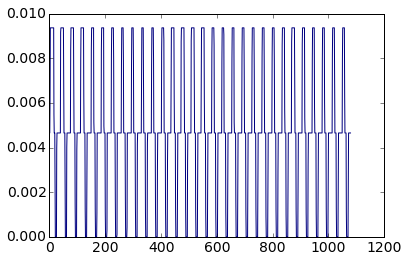

In [427]:
j = 0
plt.plot(pert_bench.dataDynLayers['LaHc1TH_lv_ave'][1:,2,1],color=matplotlib.cm.jet(j))

In [475]:
# Version with the 3 variable plots all in one
def plot_layers_lvs_var(data,diffdata,var,diff=True):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    fig, axes = plt.subplots(ncols=4,nrows=1,sharex=True)    
    ax = 0
    var_dic = { 'TH' : 'LaHc1TH_lv_ave' , 'RHO' : 'LaHc2RHO_lv_ave' , 'SLT' : 'LaHc3SLT_lv_ave' }
    lv_var = {'TH': levels_TH , 'RHO' : levels_RHO , 'SLT' : levels_SLT }
    lvar_nz = {'TH' : range(0,21,1) , 'RHO' : range(24,40,1) , 'SLT' : range(24,40,1)}
    
    for r in range(0,4,1):
        if diff:
            temp = data.dataDynLayers[var_dic[var]][:,r,:]-diffdata.dataDynLayers[var_dic[var]][:,r,:]
        else:
            temp = data.dataDynLayers[var_dic[var]][:,r,:]
        for j in lvar_nz[var]:
            col = int((j - min(lvar_nz[var]))/float((max(lvar_nz[var]))- (min(lvar_nz[var])))*256)
            if j%2 == 0:
                axes.flat[ax].plot(data.dataDynLayers['years'],temp[1:,j],color=matplotlib.cm.jet(col), label = lv_var[var][j])
            else:
                axes.flat[ax].plot(data.dataDynLayers['years'],temp[1:,j],color=matplotlib.cm.jet(col))
            axes.flat[ax].set_title(var+' thick in '+reg_title[r])
        ax += 1
    if diff:
        fig.suptitle("Difference "+var+" Layer thickness",x=1.1,y=1.7,fontsize=18)
    else:
        fig.suptitle(var+" Layer thickness",x=1.1,y=1.7,fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    fig.subplots_adjust(right=2.1,top=1.5)

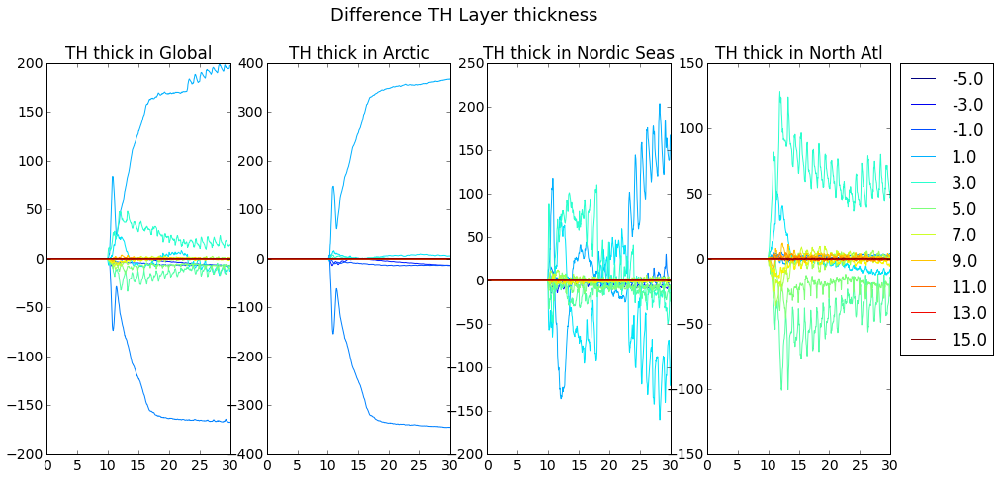

In [476]:
plot_layers_lvs_var(pert_const,pert_bench,'TH')

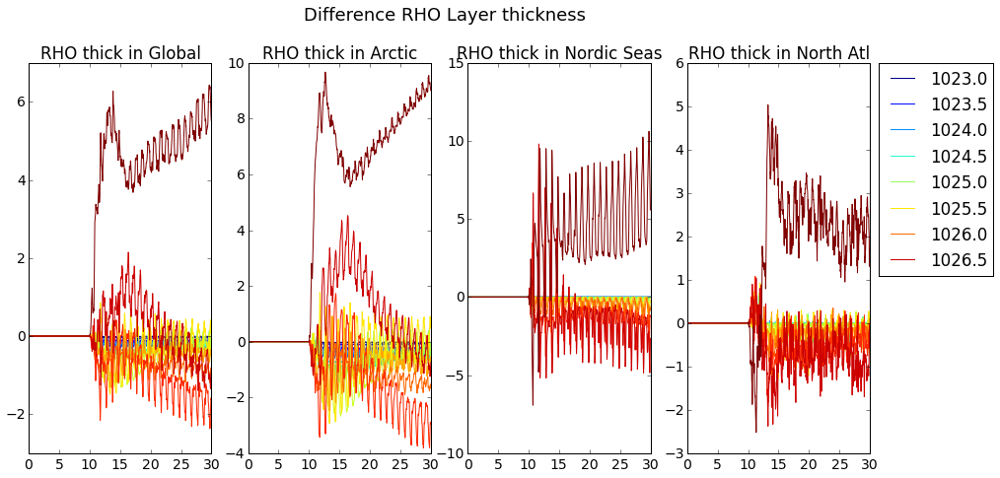

In [477]:
plot_layers_lvs_var(pert_const,pert_bench,'RHO')

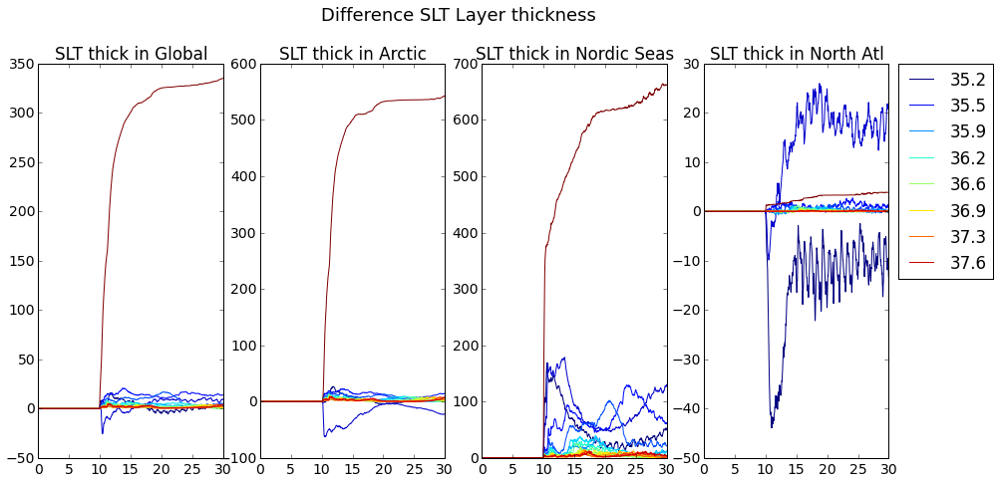

In [478]:
plot_layers_lvs_var(pert_const,pert_bench,'SLT')

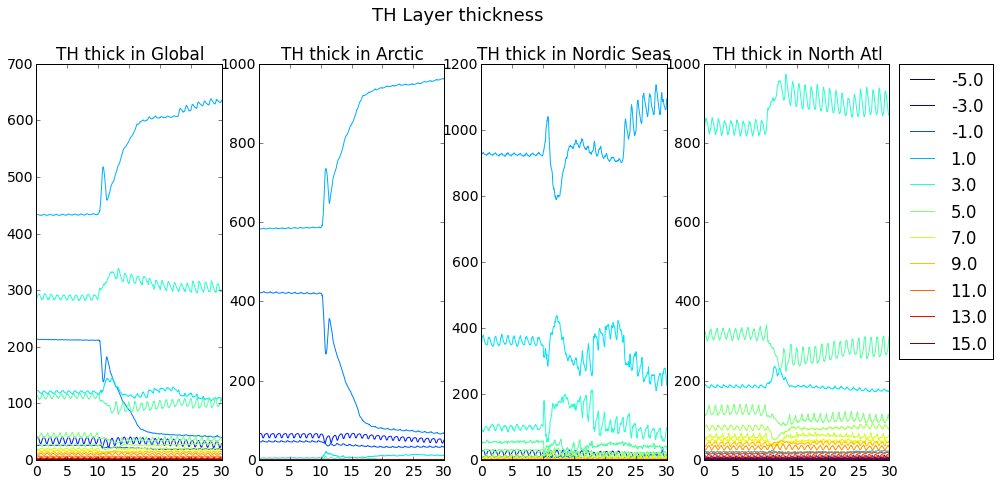

In [479]:
plot_layers_lvs_var(pert_const,pert_bench,'TH',diff=False)

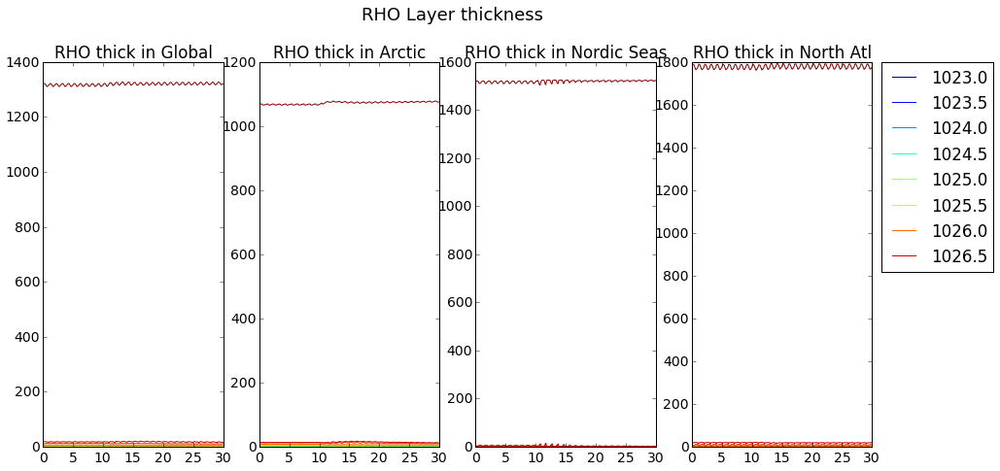

In [480]:
plot_layers_lvs_var(pert_const,pert_bench,'RHO',diff=False)

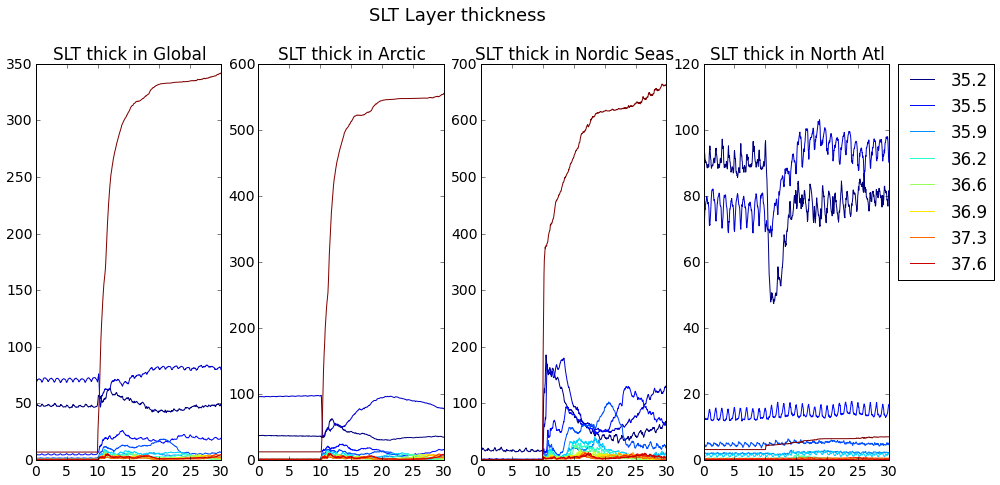

In [481]:
plot_layers_lvs_var(pert_const,pert_bench,'SLT',diff=False)

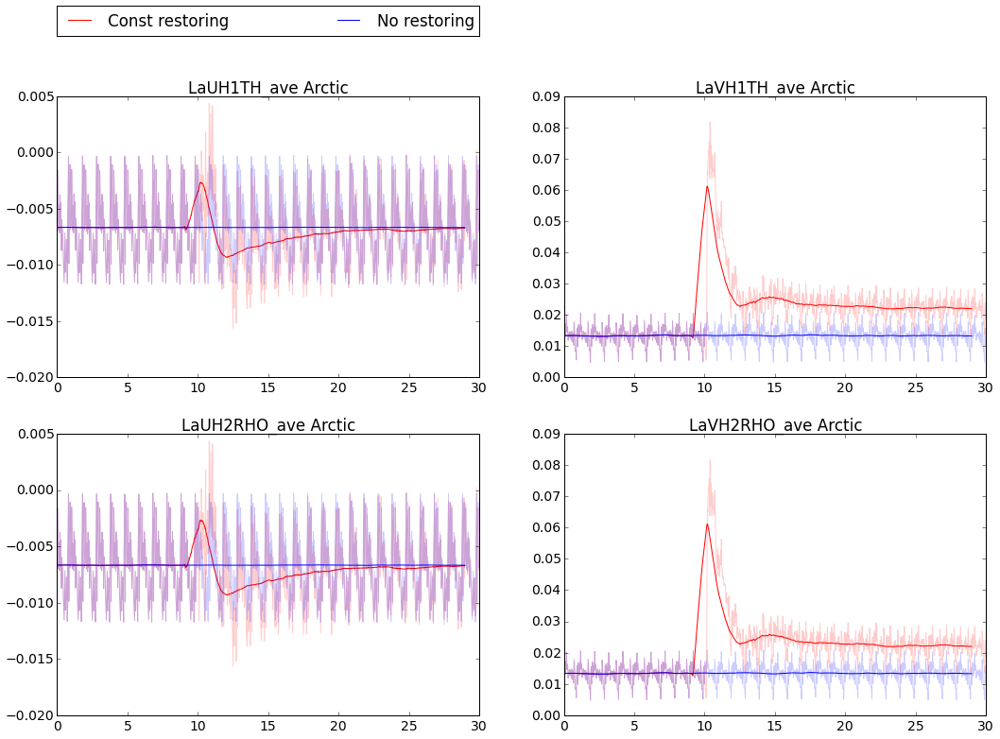

In [360]:
def plot_dynStLayers(monitor_list,var_list,reg,row=2,col=3):
    # this function is meant to plot monitor variables   
    
    titles = {}
    unity = {}
    region = { 0 : 'Global' ,  1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl' }
    
    fig, axes = plt.subplots(row,col)
    ax_ind = 0
    for var in var_list:
        for mon in monitor_list:
            axes.flat[ax_ind].plot(monitor_list[mon].dataDynLayers['years'],\
                                   monitor_list[mon].dataDynLayers[var][1:,reg],monitor_list[mon].color,alpha=0.2)
            axes.flat[ax_ind].plot(monitor_list[mon].dataDynLayers['years'][0:-12*3],\
                                   runningMeanFast(monitor_list[mon].dataDynLayers[var][1:,reg],12*3)[0:-12*3]\
                                   ,monitor_list[mon].color,label=monitor_list[mon].title)
            axes.flat[ax_ind].set_title(var+' '+region[reg])

            plt.legend(bbox_to_anchor=(-1.2, 1.02, 1., 1.5),
                   ncol=4, mode="expand", borderaxespad=0.)
            #axes.flat[ax_ind].set_ylabel(unity[var])
            monitor_list[mon]
        ax_ind += 1
    fig.subplots_adjust(right=2.4,top=2.4)
plot_dynStLayers({0:pert_const, 1 :pert_bench},['LaUH1TH_ave','LaVH1TH_ave','LaUH2RHO_ave','LaVH2RHO_ave'],\
                 reg=1,row=2,col=2)

In [347]:
def plot_layers_lv(monitor_list,var,variable,vimin,vimax,cmap):
    reg_title = { 0 : 'Global' , 1 : 'Arctic' , 2 : 'Nordic Seas' , 3 : 'North Atl'}
    
    col = len(reg_title)
    row = len(monitor_list)
    regzs = [0,46,45,50]
    fig, axes = plt.subplots(nrows=row, ncols=col, sharex=True, sharey=True)
    ax_ind = 0 ; col_ind = 0 ;
    lv_var = {'TH': levels_TH , 'RHO' : levels_RHO , 'SLT' : levels_SLT }
    lvar_nz = {'TH' : range(0,24,1) , 'RHO' : range(24,40,1) , 'SLT' : range(24,40,1)}
    ticks = np.linspace(vimin,vimax,5)
    for mon in monitor_list:
        for reg in range(0,4):
            ca = axes.flat[ax_ind].pcolor(monitor_list[mon].dataDynLayers['years'],lv_var[variable][lvar_nz[variable]],\
                    monitor_list[mon].dataDynLayers[var][1:,reg,lvar_nz[variable]].T,\
                    vmin = vimin, vmax = vimax, cmap = cmap,)        
            axes.flat[ax_ind].set_title(reg_title[reg]+' '+monitor_list[mon].title)
            axes.flat[ax_ind].set_xlabel('Years')
            cbar = fig.colorbar(ca , ax=axes.flat[ax_ind ], ticks=ticks )
            ax_ind += 1
            
        axes.flat[col*col_ind].set_ylabel('C')
        col_ind += 1
        
    fig.subplots_adjust(right=2.4,top=2.3)

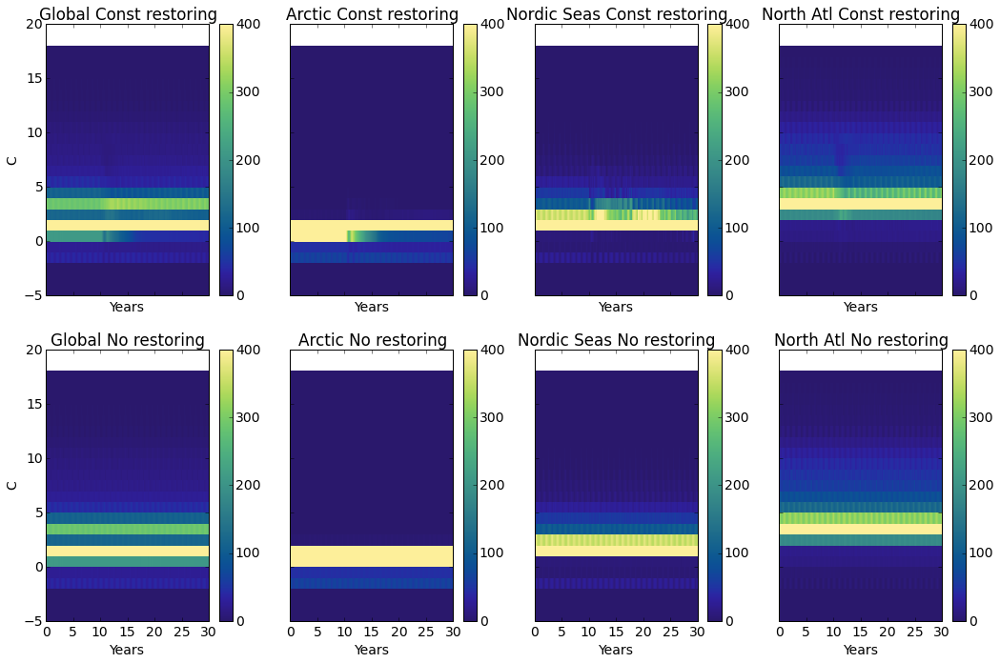

In [351]:
plot_layers_lv({0:pert_const, 1 :pert_bench},'LaHc1TH_lv_ave','TH',0,400,cmocean.cm.salinity)

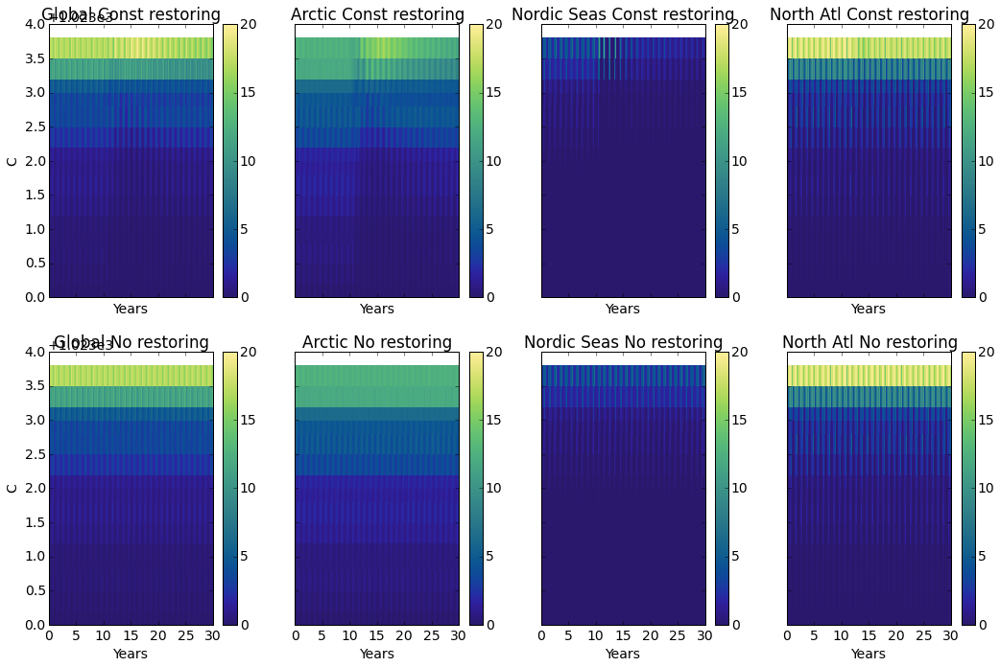

In [349]:
plot_layers_lv({0:pert_const, 1 :pert_bench},'LaHc2RHO_lv_ave','RHO',0,20,cmocean.cm.salinity)

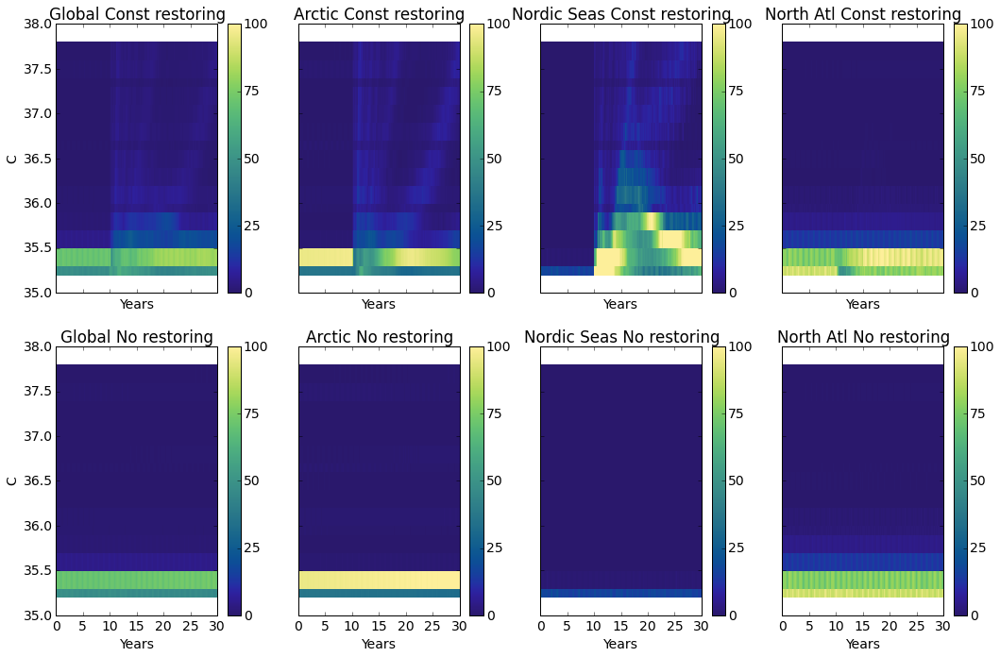

In [352]:
plot_layers_lv({0:pert_const, 1 :pert_bench},'LaHc3SLT_lv_ave','SLT',0,100,cmocean.cm.salinity)

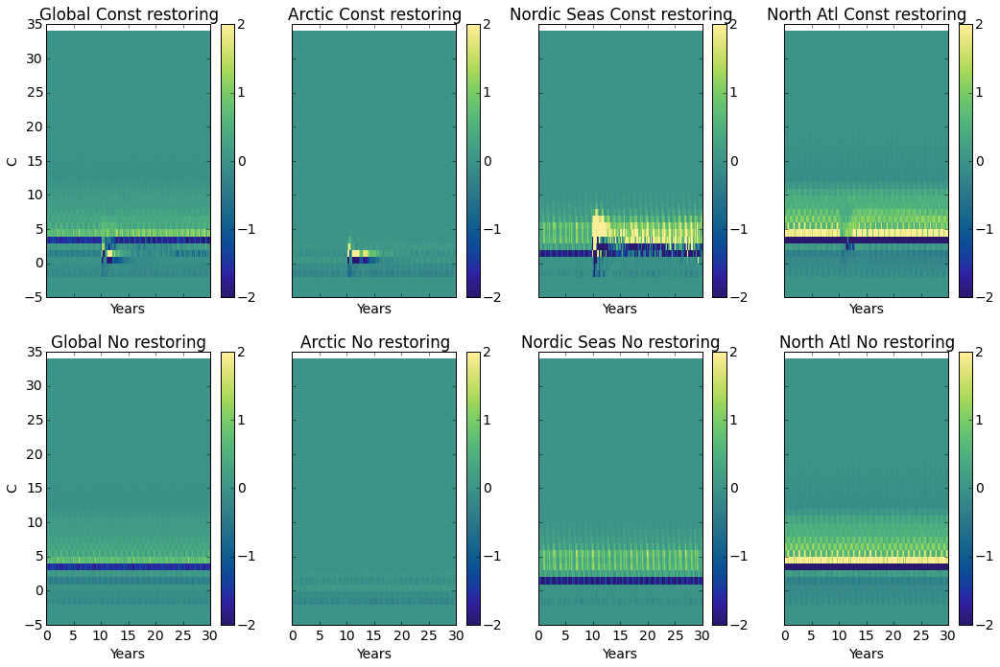

In [333]:
plot_layers_lv({0:pert_const, 1 :pert_bench},'LaUH1TH_lv_ave','TH',-2,2,cmocean.cm.salinity)

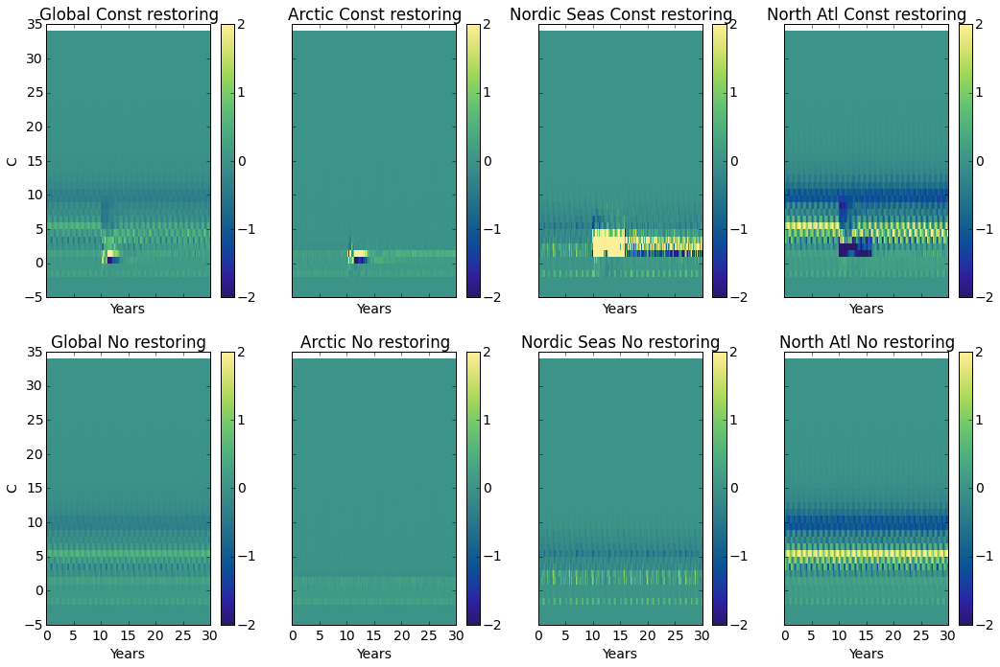

In [334]:
plot_layers_lv({0:pert_const, 1 :pert_bench},'LaVH1TH_lv_ave','TH',-2,2,cmocean.cm.salinity)

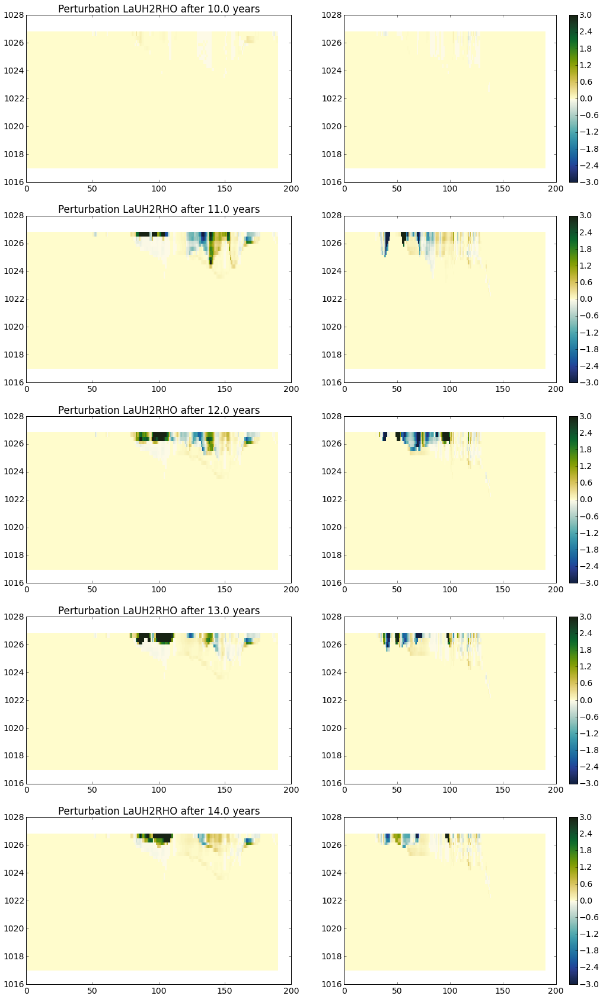

In [335]:
def plot_layer(data,data_diff,layer,timings,vimin=-3,vimax=3):
    ax_ind = 0
    col = 2
    row = len(timings)
    fig, axes = plt.subplots(row,col)

    cmap= cmocean.cm.velocity
    cmap.set_bad('grey',1.)
    kk = 1 
    for t in timings:
        y1 = 0
        y2 = 190
        x1 = 75
        masked_array = np.ma.array((data.layers[layer] - data_diff.layers[layer])[t,:,x1*kk,y1*kk:y2*kk],\
                                   mask=np.isnan((data.layers[layer] - data_diff.layers[layer])[t,:,x1*kk,y1*kk:y2*kk]))        
        ca = axes.flat[ax_ind*col].pcolormesh(data.X[y1*kk:y2*kk],levels_RHO,masked_array,vmin = vimin, vmax = vimax,cmap=cmap,)
        
        axes.flat[ax_ind*col].set_title("Perturbation "+layer+" after "+str(round(data.layers['years'][t],2))+" years")

        x1 = 0
        x2 = 190
        y1 = 120
        masked_array = np.ma.array((data.layers[layer] - data_diff.layers[layer])[t,:,x1*kk:x2*kk,y1*kk],\
                                   mask=np.isnan((data.layers[layer] - data_diff.layers[layer])[t,:,x1*kk:x2*kk,y1*kk]))
        ca = axes.flat[ax_ind*col + 1].pcolormesh(data.Y[x1*kk:x2*kk],levels_RHO,masked_array,vmin = vimin, vmax = vimax, cmap=cmap)
        cbar = fig.colorbar(ca , ax=axes.flat[ax_ind*col + 1])
        
        ax_ind += 1
    fig.subplots_adjust(right=2.4,top=5.8)
plot_layer(pert_const,pert_bench,'LaUH2RHO',range(10,15,1))

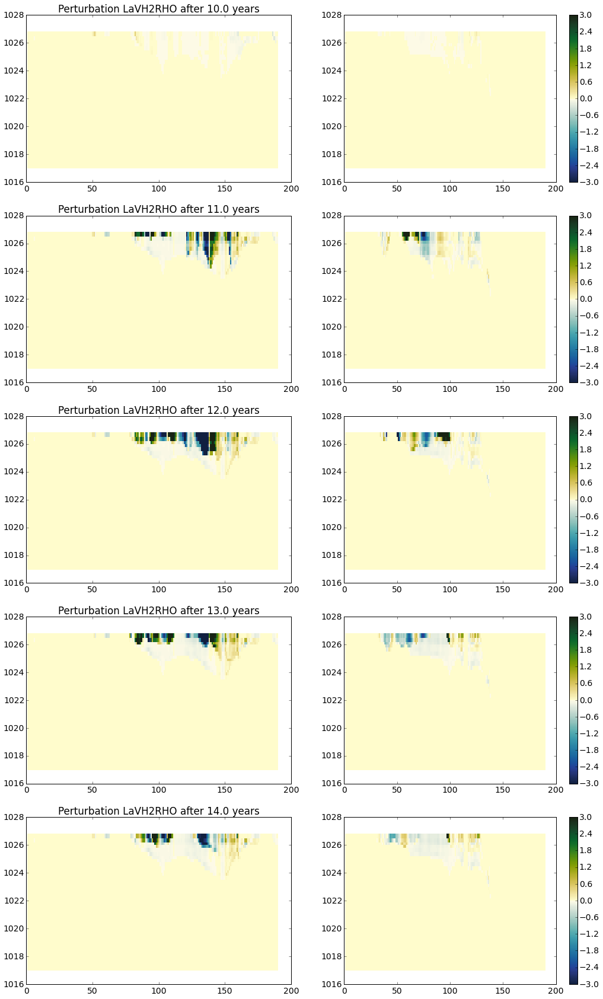

In [336]:
plot_layer(pert_const,pert_bench,'LaVH2RHO',range(10,15,1))

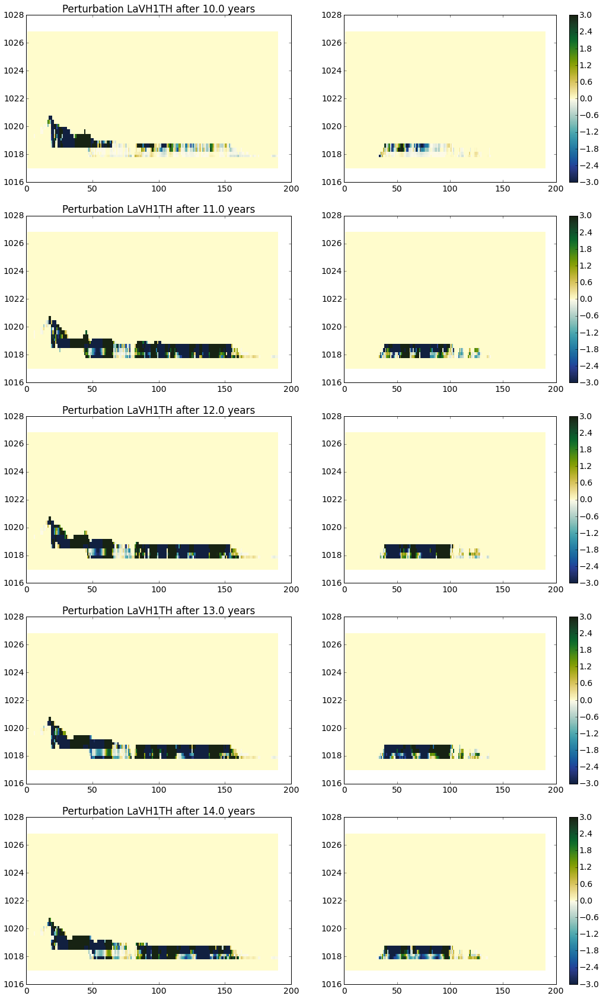

In [337]:
plot_layer(pert_const,pert_bench,'LaVH1TH',range(10,15,1))

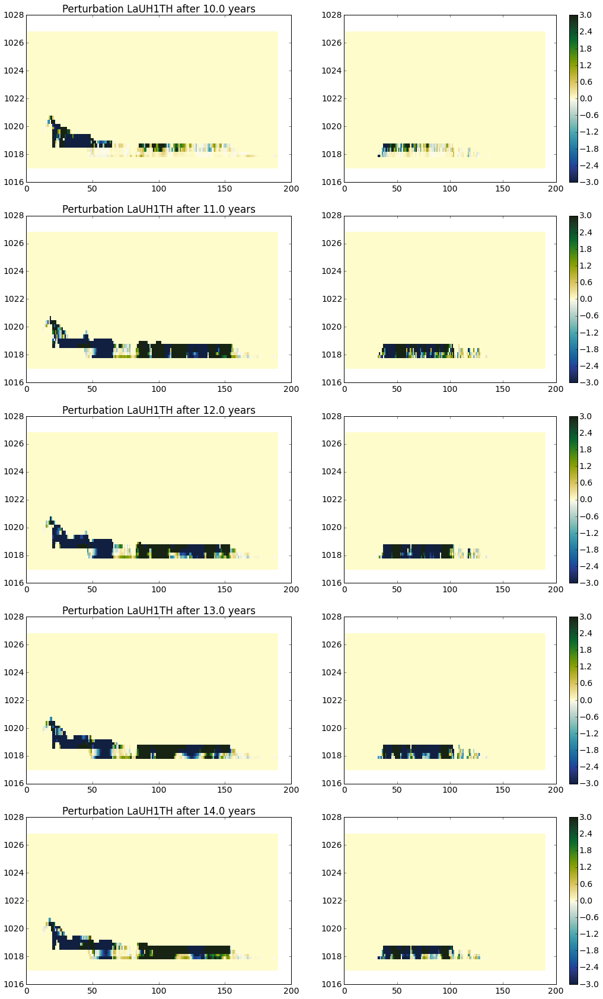

In [338]:
plot_layer(pert_const,pert_bench,'LaUH1TH',range(10,15,1))